In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter

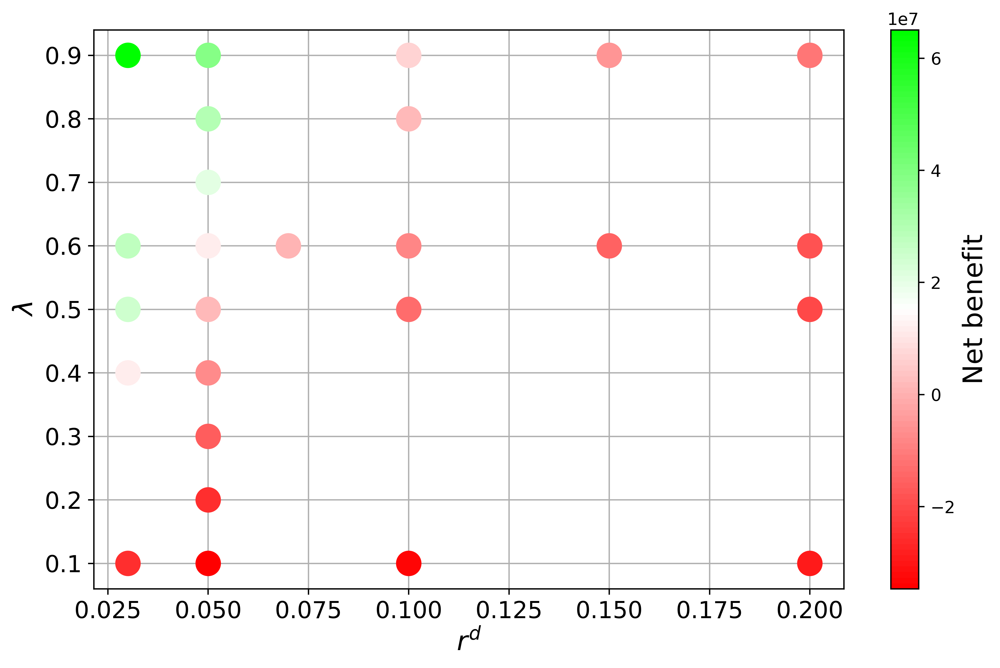

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# List of (alpha, r) tuples
alpha_r_values = [(0.9, 0.03), (0.9, 0.1), (0.9, 0.2), (0.1, 0.03), (0.1, 0.1), (0.1, 0.2), (0.5, 0.03), (0.5, 0.1), (0.5, 0.2) , (0.4, 0.03), (0.4, 0.05), (0.4, 0.07), (0.4, 0.15), 
                  (0.4, 0.2), (0.1, 0.05), (0.2, 0.05), (0.3, 0.05), (0.5, 0.05), (0.6, 0.05), (0.7, 0.05), (0.8, 0.05), (0.9, 0.05), (0.1,0.15), (0.4,0.1), (0.6,0.03), (0.2,0.1)]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column for strategy 'JAA'
for alpha, r in alpha_r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}_r={r}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    net_benefit_jaa = df.loc['JAA', 'net_benefit']
    data[(1 - alpha, r)] = net_benefit_jaa

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(list(data.items()), columns=['lambda_r', 'net_benefit'])
combined_df[['lambda', 'r']] = pd.DataFrame(combined_df['lambda_r'].tolist(), index=combined_df.index)
combined_df.drop(columns='lambda_r', inplace=True)

# Function to format the y-axis tick labels as decimals
def decimal_formatter(x, pos):
    return f'{x:.1f}'

# Define the custom colormap from red to green
colors = [(1, 0, 0), (1, 1, 1), (0, 1, 0)]  # Red to white to green
n_bins = 100  # Discretize the colormap
cmap_name = 'red_white_green'
cm = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plotting
plt.figure(figsize=(10, 6), dpi=500)
scatter = plt.scatter(combined_df['r'], combined_df['lambda'], c=combined_df['net_benefit'], cmap=cm, s=200, zorder=3)
#plt.colorbar(scatter, label='Net benefit (million USD)', fontsize=16)
cbar = plt.colorbar(scatter)
cbar.set_label('Net benefit', fontsize=16)

# Set y-axis formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(decimal_formatter))

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(True)

plt.show()


In [ ]:
combined_df

,net_benefit,lambda,r
0,-2.563653e+07,0.1,0.03
1,-3.275143e+07,0.1,0.10
2,-2.941783e+07,0.1,0.20
3,6.505669e+07,0.9,0.03
4,7.104551e+06,0.9,0.10
5,-1.115601e+07,0.9,0.20
6,2.463066e+07,0.5,0.03
7,-1.282344e+07,0.5,0.10
8,-2.028692e+07,0.5,0.20
9,2.735630e+07,0.6,0.03


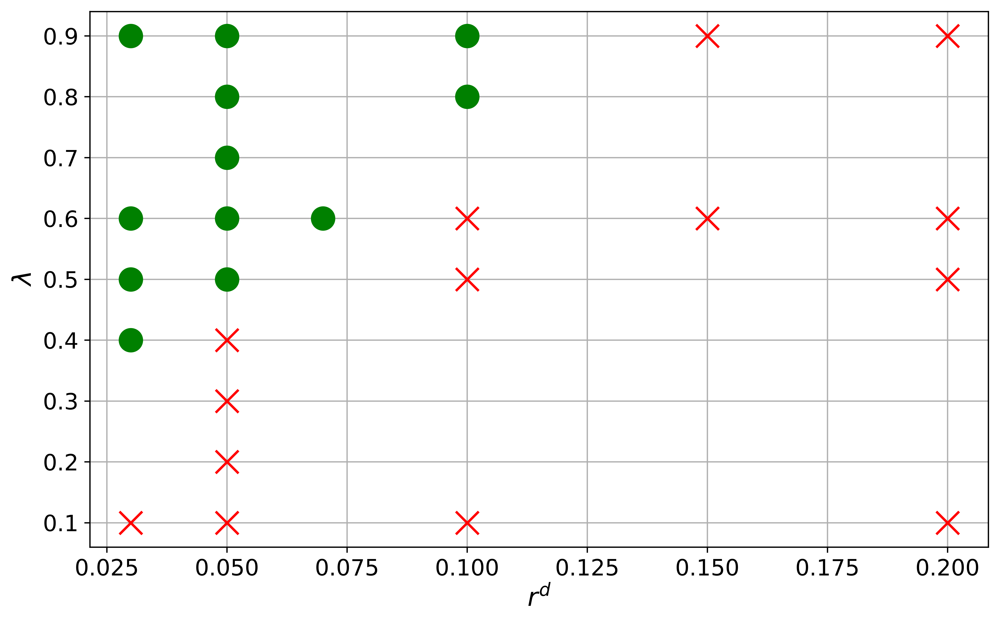

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# List of (alpha, r) tuples
alpha_r_values = [(0.9, 0.03), (0.9, 0.1), (0.9, 0.2), (0.1, 0.03), (0.1, 0.1), (0.1, 0.2), (0.5, 0.03), (0.5, 0.1), (0.5, 0.2), (0.4, 0.03), (0.4, 0.05), (0.4, 0.07), (0.4, 0.15), (0.4, 0.2), 
                  (0.1, 0.05), (0.2, 0.05), (0.3, 0.05), (0.5, 0.05), (0.6, 0.05), (0.7, 0.05), (0.8, 0.05), (0.9, 0.05), (0.1,0.15), (0.4,0.1), (0.6,0.03), (0.2,0.1)]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column for strategy 'JAA'
for alpha, r in alpha_r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}_r={r}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    net_benefit_jaa = df.loc['JAA', 'net_benefit']
    data[(1 - alpha, r)] = net_benefit_jaa

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(list(data.items()), columns=['lambda_r', 'net_benefit'])
combined_df[['lambda', 'r']] = pd.DataFrame(combined_df['lambda_r'].tolist(), index=combined_df.index)
combined_df.drop(columns='lambda_r', inplace=True)

# Function to format the y-axis tick labels as decimals
def decimal_formatter(x, pos):
    return f'{x:.1f}'

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

# Remove colorbar
# cbar = plt.colorbar()
# cbar.set_label('Net benefit', fontsize=16)

# Set y-axis formatter
plt.gca().yaxis.set_major_formatter(FuncFormatter(decimal_formatter))

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.grid(True)

plt.show()


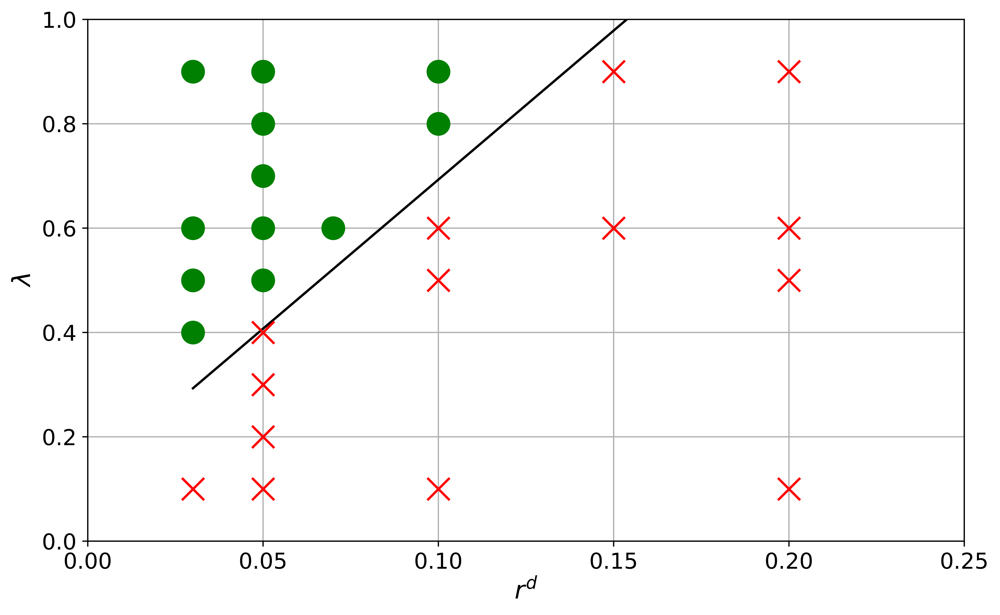

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import numpy as np

# Label the data
combined_df['label'] = combined_df['net_benefit'] >= 0

# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

svm = SVC(kernel='linear')
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(X_scaled[:, 0].min(), X_scaled[:, 0].max())
yy = a * xx - (svm.intercept_[0] / w[1])

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.plot(scaler.inverse_transform(np.c_[xx, yy])[:, 0], scaler.inverse_transform(np.c_[xx, yy])[:, 1], 'k-')

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1)

plt.grid(True)
plt.show()


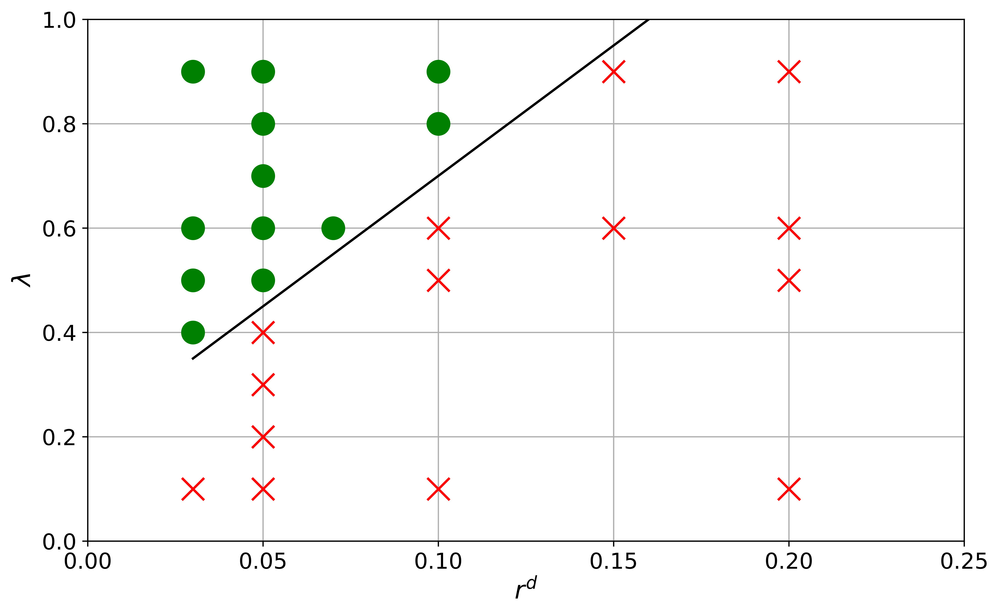

In [ ]:
# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(X_scaled[:, 0].min(), X_scaled[:, 0].max())
yy = a * xx - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
xx_orig, yy_orig = scaler.inverse_transform(np.c_[xx, yy]).T

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.plot(xx_orig, yy_orig, 'k-')

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(0, 1)

plt.grid(True)
plt.show()

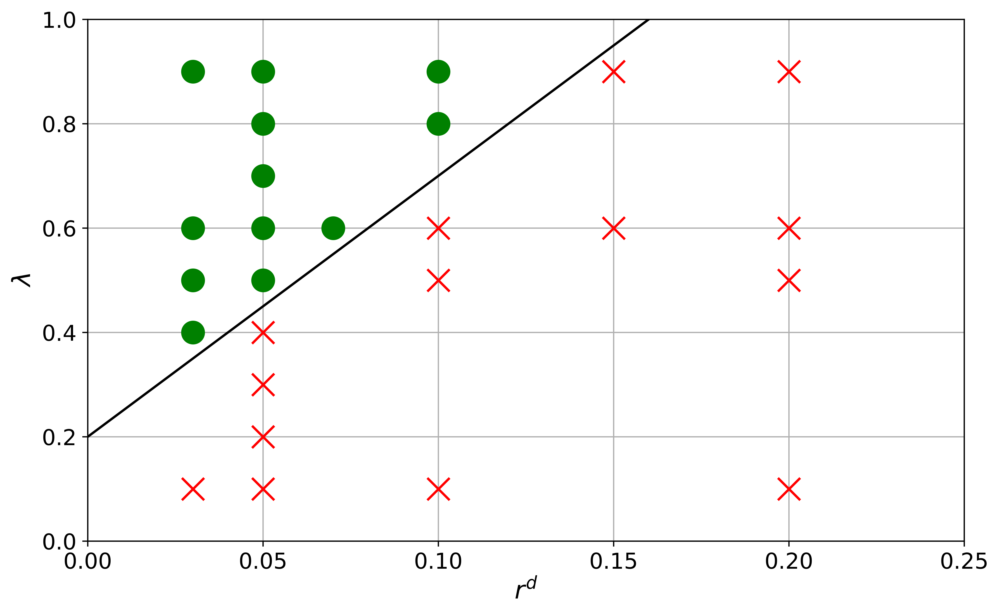

In [ ]:
# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]

# Define xx to cover the full x-axis range
xx = np.linspace(0, 0.25, 100)  # Adjust this range as needed

# Scale xx using the same scaler
xx_scaled = scaler.transform(np.c_[xx, np.zeros_like(xx)])[:, 0]

# Calculate the corresponding yy values
yy_scaled = a * xx_scaled - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
_, yy_orig = scaler.inverse_transform(np.c_[xx_scaled, yy_scaled]).T

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.plot(xx, yy_orig, 'k-')

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(0, 1)

plt.grid(True)
plt.show()

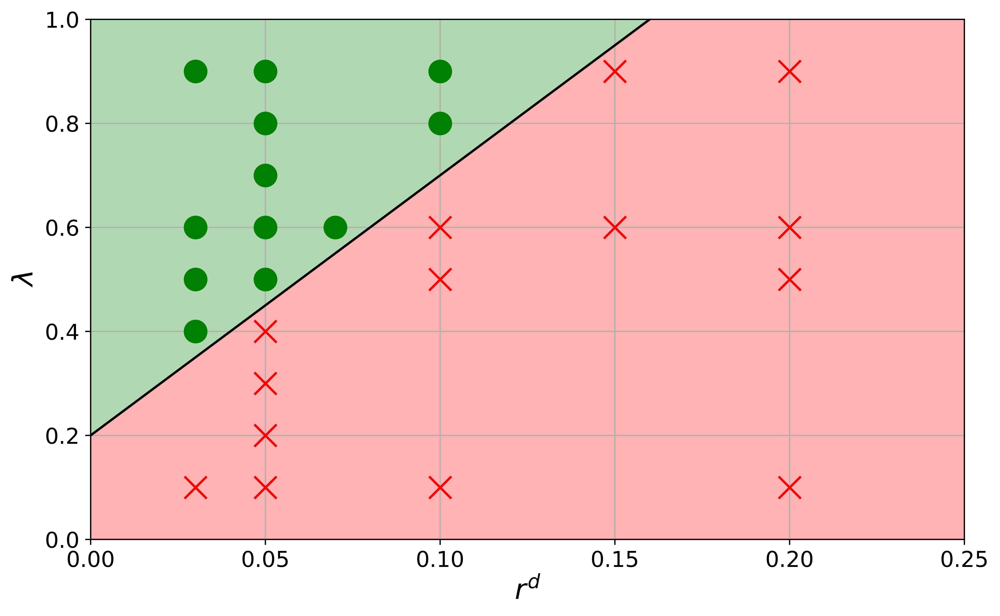

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]

# Define xx to cover the full x-axis range
xx = np.linspace(0, 0.25, 100)  # Adjust this range as needed

# Scale xx using the same scaler
xx_scaled = scaler.transform(np.c_[xx, np.zeros_like(xx)])[:, 0]

# Calculate the corresponding yy values
yy_scaled = a * xx_scaled - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
_, yy_orig = scaler.inverse_transform(np.c_[xx_scaled, yy_scaled]).T

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.plot(xx, yy_orig, 'k-')

# Shade the areas
plt.fill_between(xx, yy_orig, 1, color='green', alpha=0.3)
plt.fill_between(xx, yy_orig, 0, color='red', alpha=0.3)

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=18)
plt.ylabel(r'$\lambda$', fontsize=18)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(0, 1)

plt.grid(True)
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_2364\4099292732.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_pos = cm.get_cmap('Greens')
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_2364\4099292732.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_neg = cm.get_cmap('Reds')


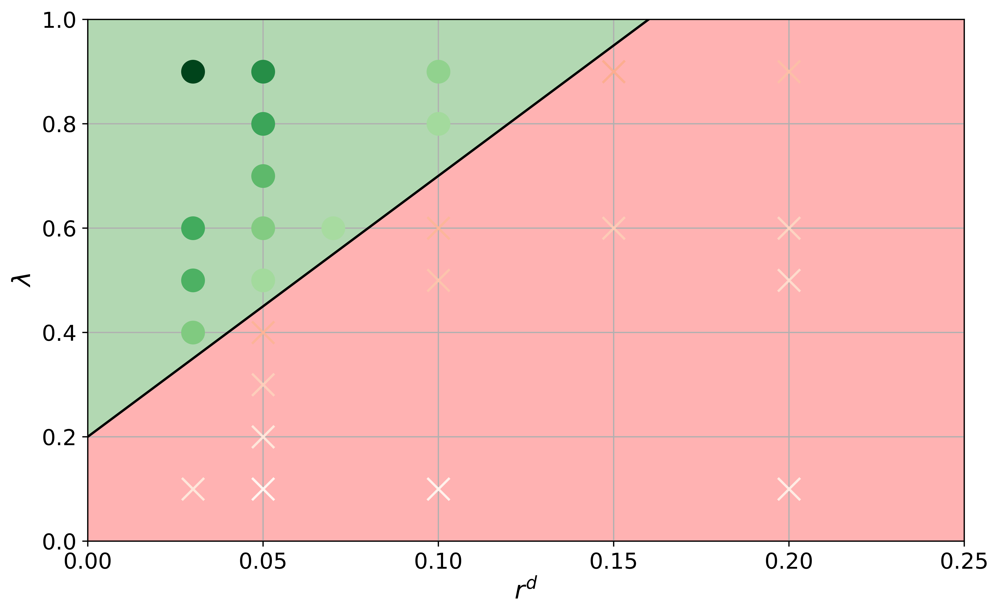

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from matplotlib.colors import Normalize
import matplotlib.cm as cm

# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]

# Define xx to cover the full x-axis range
xx = np.linspace(0, 0.25, 100)  # Adjust this range as needed

# Scale xx using the same scaler
xx_scaled = scaler.transform(np.c_[xx, np.zeros_like(xx)])[:, 0]

# Calculate the corresponding yy values
yy_scaled = a * xx_scaled - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
_, yy_orig = scaler.inverse_transform(np.c_[xx_scaled, yy_scaled]).T

# Create a colormap for positive and negative net_benefit
norm = Normalize(vmin=combined_df['net_benefit'].min(), vmax=combined_df['net_benefit'].max())
cmap_pos = cm.get_cmap('Greens')
cmap_neg = cm.get_cmap('Reds')

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.plot(xx, yy_orig, 'k-')

# Shade the areas
plt.fill_between(xx, yy_orig, 1, color='green', alpha=0.3)
plt.fill_between(xx, yy_orig, 0, color='red', alpha=0.3)

# Draw scatter points with gradient colors
for index, row in combined_df.iterrows():
    if row['net_benefit'] >= 0:
        color = cmap_pos(norm(row['net_benefit']))
        marker_style = 'o'
    else:
        color = cmap_neg(norm(row['net_benefit']))
        marker_style = 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(0, 1)

plt.grid(True)
plt.show()


C:\Users\Mahsa\AppData\Local\Temp\ipykernel_2364\49036773.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_pos = cm.get_cmap('Greens')
C:\Users\Mahsa\AppData\Local\Temp\ipykernel_2364\49036773.py:39: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap_neg = cm.get_cmap('Reds_r')  # Reverse the Reds colormap


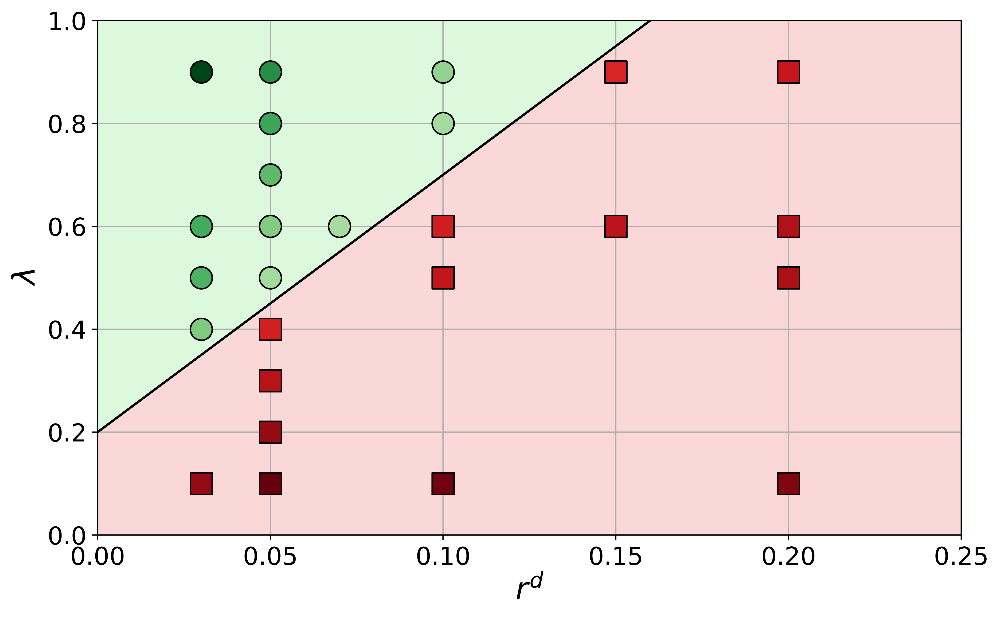

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from matplotlib.colors import Normalize
import matplotlib.cm as cm

# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]

# Define xx to cover the full x-axis range
xx = np.linspace(0, 0.25, 100)  # Adjust this range as needed

# Scale xx using the same scaler
xx_scaled = scaler.transform(np.c_[xx, np.zeros_like(xx)])[:, 0]

# Calculate the corresponding yy values
yy_scaled = a * xx_scaled - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
_, yy_orig = scaler.inverse_transform(np.c_[xx_scaled, yy_scaled]).T

# Create a colormap for positive and negative net_benefit
norm = Normalize(vmin=combined_df['net_benefit'].min(), vmax=combined_df['net_benefit'].max())
cmap_pos = cm.get_cmap('Greens')
cmap_neg = cm.get_cmap('Reds_r')  # Reverse the Reds colormap

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.plot(xx, yy_orig, 'k-')

# Shade the areas with light colors
plt.fill_between(xx, yy_orig, 1, color='lightgreen', alpha=0.3)
plt.fill_between(xx, yy_orig, 0, color='lightcoral', alpha=0.3)

# Draw scatter points with gradient colors and outline
for index, row in combined_df.iterrows():
    if row['net_benefit'] >= 0:
        color = cmap_pos(norm(row['net_benefit']))
        marker_style = 'o'
        edge_color = 'black'
    else:
        color = cmap_neg(norm(row['net_benefit']))
        marker_style = 's'  # Use square markers
        edge_color = 'black'
    plt.scatter(row['r'], row['lambda'], facecolor=color, edgecolor=edge_color, s=200, zorder=3, marker=marker_style, linewidth=1)

plt.xlabel(r'$r^d$', fontsize=20)
plt.ylabel(r'$\lambda$', fontsize=20)

# Increase font size for x and y ticks
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

plt.xlim(0, 0.25)
plt.ylim(0, 1)

plt.grid(True)

plt.show()


In [ ]:
combined_df

,net_benefit,lambda,r,label
0,-2.563653e+07,0.1,0.03,False
1,-3.275143e+07,0.1,0.10,False
2,-2.941783e+07,0.1,0.20,False
3,6.505669e+07,0.9,0.03,True
4,7.104551e+06,0.9,0.10,True
5,-1.115601e+07,0.9,0.20,False
6,2.463066e+07,0.5,0.03,True
7,-1.282344e+07,0.5,0.10,False
8,-2.028692e+07,0.5,0.20,False
9,2.735630e+07,0.6,0.03,True


In [ ]:
combined_df['net_benefit'].min()

-34659158.87

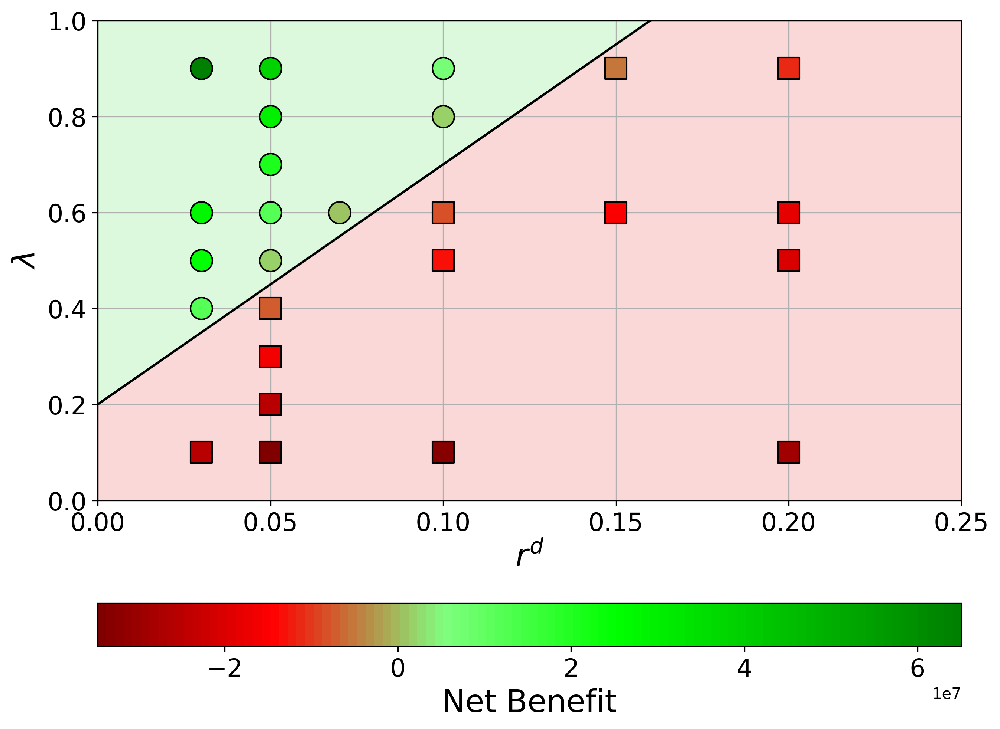

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from matplotlib.colors import Normalize, LinearSegmentedColormap
import matplotlib.cm as cm

# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]

# Define xx to cover the full x-axis range
xx = np.linspace(0, 0.25, 100)  # Adjust this range as needed

# Scale xx using the same scaler
xx_scaled = scaler.transform(np.c_[xx, np.zeros_like(xx)])[:, 0]

# Calculate the corresponding yy values
yy_scaled = a * xx_scaled - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
_, yy_orig = scaler.inverse_transform(np.c_[xx_scaled, yy_scaled]).T

# Create a colormap from dark red to dark green
#colors = [(1, 0, 0), (0, 1, 0)]  # R -> G
#colors = [(0.5, 0, 0), (0, 0.5, 0)]  # Dark red to dark green
colors = [
    (0.5, 0, 0),  # Dark red
#    (0.75, 0, 0),  # Medium red
    (1, 0, 0),  # Light red
#    (1, 0.5, 0.5),  # Light red transition
    (0.5, 1, 0.5),  # Light green transition
    (0, 1, 0),  # Light green
    (0, 0.75, 0),  # Medium green
    (0, 0.5, 0)  # Dark green
]
n_bins = 100  # Discretize the interpolation into bins
cmap_name = 'red_green'
cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plotting
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

# Plot the decision boundary
ax.plot(xx, yy_orig, 'k-')

# Shade the areas with light colors
ax.fill_between(xx, yy_orig, 1, color='lightgreen', alpha=0.3)
ax.fill_between(xx, yy_orig, 0, color='lightcoral', alpha=0.3)

# Draw scatter points with gradient colors and outline
norm = Normalize(vmin=combined_df['net_benefit'].min(), vmax=combined_df['net_benefit'].max())
for index, row in combined_df.iterrows():
    color = cmap(norm(row['net_benefit']))
    marker_style = 'o' if row['net_benefit'] >= 0 else 's'  # Use square markers for negative
    edge_color = 'black'
    ax.scatter(row['r'], row['lambda'], facecolor=color, edgecolor=edge_color, s=200, zorder=3, marker=marker_style, linewidth=1)

ax.set_xlabel(r'$r^d$', fontsize=20)
ax.set_ylabel(r'$\lambda$', fontsize=20)

# Increase font size for x and y ticks
ax.tick_params(axis='both', labelsize=16)

ax.set_xlim(0, 0.25)
ax.set_ylim(0, 1)

ax.grid(True)

# Add color bar at the bottom
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, orientation='horizontal', pad=0.15, ax=ax)
cbar.set_label('Net Benefit', fontsize=20)
cbar.ax.tick_params(labelsize=16)


plt.show()


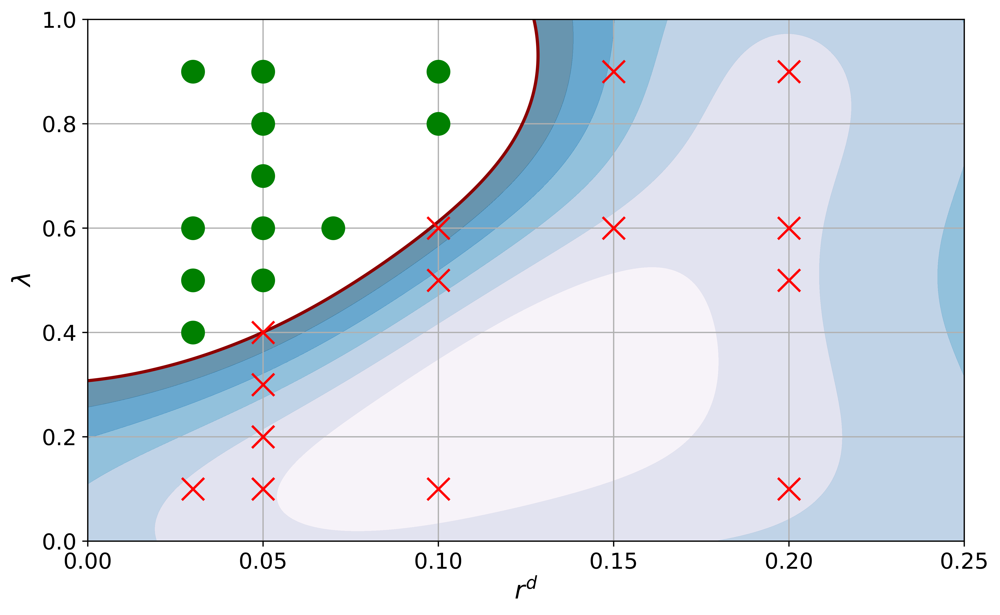

In [189]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import numpy as np

# Label the data
combined_df['label'] = combined_df['net_benefit'] >= 0

# Train SVM with RBF kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

svm = SVC(kernel='rbf', gamma='scale')
svm.fit(X_scaled, y)

# Create a mesh grid for plotting the decision boundary
xx, yy = np.meshgrid(np.linspace(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1, 500), 
                     np.linspace(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1, 500))
Z = svm.decision_function(scaler.transform(np.c_[xx.ravel(), yy.ravel()])).reshape(xx.shape)

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary and margins
plt.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap=plt.cm.PuBu, alpha=0.6)
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1)

plt.grid(True)
plt.show()


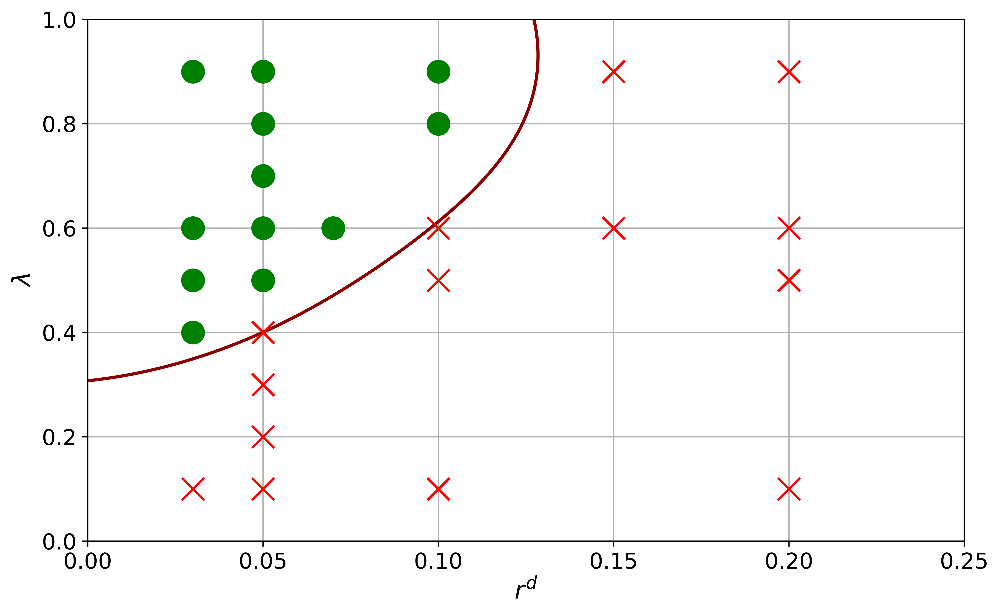

In [190]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
import numpy as np

# Assuming combined_df is already created and populated as per previous steps

# Label the data
combined_df['label'] = combined_df['net_benefit'] >= 0

# Train SVM with RBF kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

svm = SVC(kernel='rbf', gamma='scale')
svm.fit(X_scaled, y)

# Create a mesh grid for plotting the decision boundary
xx, yy = np.meshgrid(np.linspace(X[:, 0].min() - 0.1, X[:, 0].max() + 0.1, 500), 
                     np.linspace(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1, 500))
Z = svm.decision_function(scaler.transform(np.c_[xx.ravel(), yy.ravel()])).reshape(xx.shape)

# Plotting
plt.figure(figsize=(10, 6), dpi=500)

# Plot the decision boundary
plt.contour(xx, yy, Z, levels=[0], linewidths=2, colors='darkred')

# Draw scatter points
for index, row in combined_df.iterrows():
    color = 'green' if row['net_benefit'] >= 0 else 'red'
    marker_style = 'o' if row['net_benefit'] >= 0 else 'x'
    plt.scatter(row['r'], row['lambda'], color=color, s=200, zorder=3, marker=marker_style)

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel(r'$\lambda$', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.xlim(0, 0.25)
plt.ylim(X[:, 1].min() - 0.1, X[:, 1].max() + 0.1)

plt.grid(True)
plt.show()


In [162]:
combined_df

,net_benefit,lambda,r
0,-2.563653e+07,0.1,0.03
1,-3.275143e+07,0.1,0.10
2,-2.941783e+07,0.1,0.20
3,6.505669e+07,0.9,0.03
4,7.104551e+06,0.9,0.10
5,-1.115601e+07,0.9,0.20
6,2.463066e+07,0.5,0.03
7,-1.282344e+07,0.5,0.10
8,-2.028692e+07,0.5,0.20
9,2.735630e+07,0.6,0.03


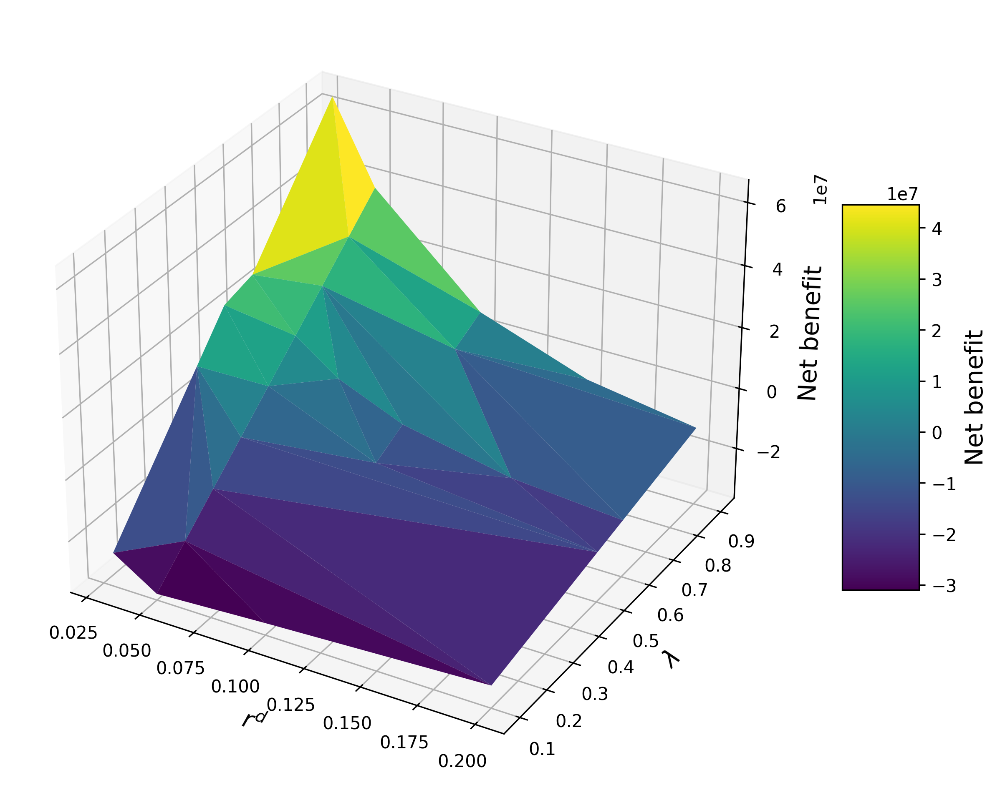

In [158]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# List of (alpha, r) tuples
alpha_r_values = [(0.9, 0.03), (0.9, 0.1), (0.9, 0.2), (0.1, 0.03), (0.1, 0.1), (0.1, 0.2), (0.5, 0.03), (0.5, 0.1), (0.5, 0.2) , (0.4, 0.03), (0.4, 0.05), (0.4, 0.07), (0.4, 0.15), (0.4, 0.2), 
                  (0.1, 0.05), (0.2, 0.05), (0.3, 0.05), (0.5, 0.05), (0.6, 0.05), (0.7, 0.05), (0.8, 0.05), (0.9, 0.05), (0.1,0.15), (0.4,0.1), (0.6,0.03), (0.2,0.1)]


# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column for strategy 'JAA'
for alpha, r in alpha_r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}_r={r}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    net_benefit_jaa = df.loc['JAA', 'net_benefit']
    data[(1 - alpha, r)] = net_benefit_jaa

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(list(data.items()), columns=['lambda_r', 'net_benefit'])
combined_df[['lambda', 'r']] = pd.DataFrame(combined_df['lambda_r'].tolist(), index=combined_df.index)
combined_df.drop(columns='lambda_r', inplace=True)

# Extract data for plotting
lambda_vals = combined_df['lambda'].values
r_vals = combined_df['r'].values
net_benefit_vals = combined_df['net_benefit'].values

# Create a 3D plot
fig = plt.figure(figsize=(12, 8), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Plotting the surface
surf = ax.plot_trisurf(r_vals, lambda_vals, net_benefit_vals, cmap='viridis', linewidth=0.2, antialiased=True)

# Add color bar which maps values to colors
cbar = fig.colorbar(surf, shrink=0.5, aspect=5)
cbar.set_label('Net benefit', fontsize=14)

# Set labels
ax.set_xlabel(r'$r^d$', fontsize=14)
ax.set_ylabel(r'$\lambda$', fontsize=14)
ax.set_zlabel('Net benefit', fontsize=14)

# Increase font size for ticks
ax.tick_params(axis='both', which='major', labelsize=10)

plt.show()


In [159]:
combined_df

,net_benefit,lambda,r
0,-2.563653e+07,0.1,0.03
1,-3.275143e+07,0.1,0.10
2,-2.941783e+07,0.1,0.20
3,6.505669e+07,0.9,0.03
4,7.104551e+06,0.9,0.10
5,-1.115601e+07,0.9,0.20
6,2.463066e+07,0.5,0.03
7,-1.282344e+07,0.5,0.10
8,-2.028692e+07,0.5,0.20
9,2.735630e+07,0.6,0.03


In [160]:
# Save to CSV
csv_file_path = 'combined_df.csv'
combined_df.to_csv(csv_file_path, index=False)

## SAI_{B,0}

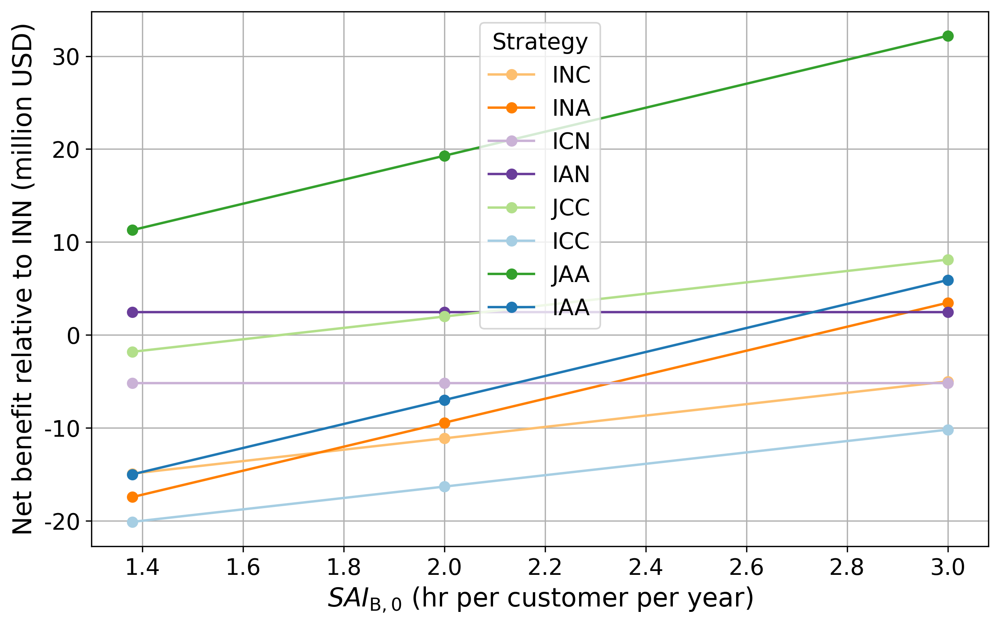

In [ ]:
# Base path to the CSV files
#base_path = '../../results/outcomes/Sensitivity/'
base_path = '../../results/outcomes/Sensitivity2/'


# List of SAI_{B,0} values
sai_values = [1.38, 2, 3]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for sai in sai_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_SAI_{{B,0}}={sai}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[sai] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])


# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter)    

plt.xlabel(r'$SAI_{\mathrm{B,0}}$ (hr per customer per year)', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
    
plt.legend(title='Strategy', title_fontsize=14, fontsize=14)

plt.grid(True)

plt.show()


## VLL_{E,R}

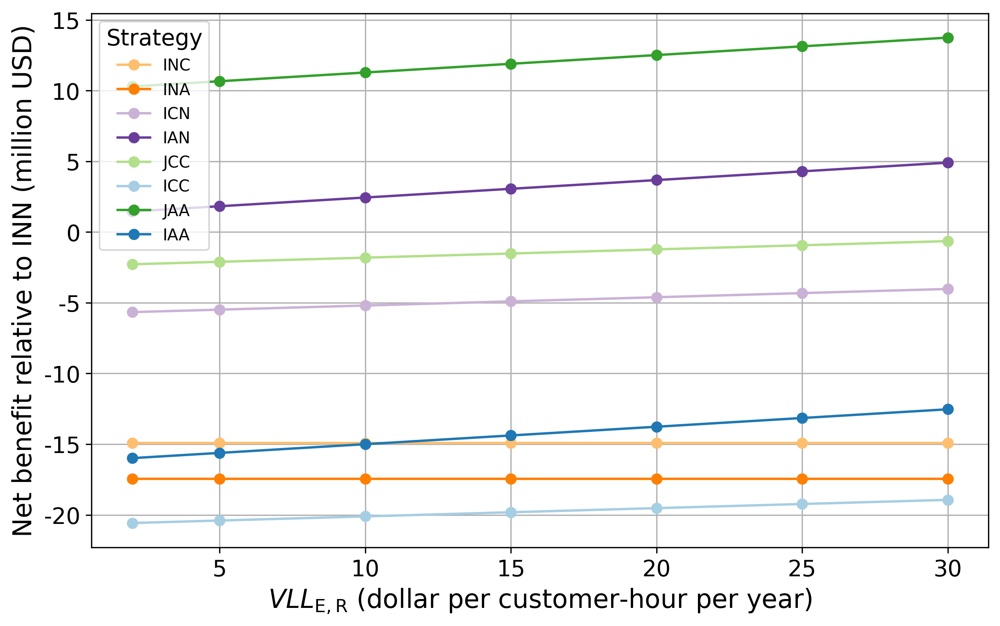

In [4]:
# List of VLL_{E,R} values
vll_values = [2, 5, 10, 15, 20, 25, 30]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_el_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']  # Change 'sai' to 'vll'

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter)        
    
plt.xlabel(r'$VLL_{\mathrm{E,R}}$ (dollar per customer-hour per year)', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)


plt.legend(title='Strategy', title_fontsize=14, fontsize=10)
plt.grid(True)

plt.show()

In [5]:
combined_df

,2,5,10,15,20,25,30
Strategy,,,,,,,
INC,-1.491349e+07,-1.491349e+07,-1.491349e+07,-1.491349e+07,-1.491349e+07,-1.491349e+07,-1.491349e+07
INA,-1.744247e+07,-1.744247e+07,-1.744247e+07,-1.744247e+07,-1.744247e+07,-1.744247e+07,-1.744247e+07
ICN,-5.661348e+06,-5.485853e+06,-5.193360e+06,-4.900868e+06,-4.608375e+06,-4.315882e+06,-4.023390e+06
IAN,1.456905e+06,1.826883e+06,2.443513e+06,3.060143e+06,3.676773e+06,4.293403e+06,4.910033e+06
JCC,-2.277271e+06,-2.101775e+06,-1.809283e+06,-1.516790e+06,-1.224297e+06,-9.318048e+05,-6.393121e+05
ICC,-2.057484e+07,-2.039934e+07,-2.010685e+07,-1.981436e+07,-1.952187e+07,-1.922937e+07,-1.893688e+07
JAA,1.029682e+07,1.066680e+07,1.128343e+07,1.190006e+07,1.251669e+07,1.313332e+07,1.374995e+07
IAA,-1.598557e+07,-1.561559e+07,-1.499896e+07,-1.438233e+07,-1.376570e+07,-1.314907e+07,-1.253244e+07


## VLL_{B,R}

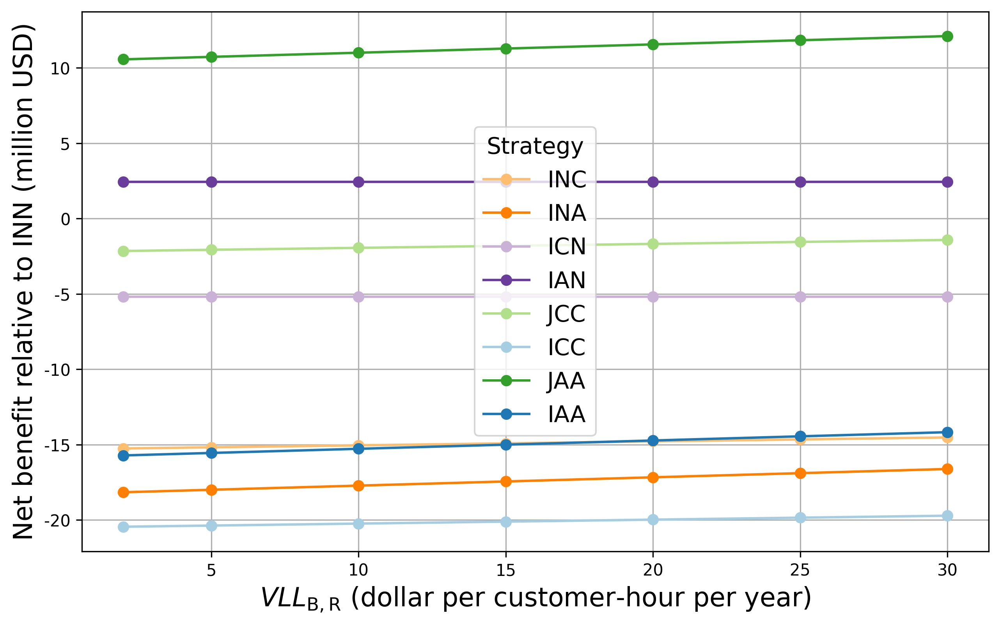

In [6]:
# List of VLL_{E,R} values
vll_values = [2, 5, 10, 15, 20, 25, 30]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_br_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']  # Change 'sai' to 'vll'

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}


# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
    
# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter)   

plt.xlabel(r'$VLL_{\mathrm{B,R}}$ (dollar per customer-hour per year)', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)
plt.legend(title='Strategy', title_fontsize=14, fontsize=14)
plt.grid(True)

plt.show()

In [7]:
combined_df

,2,5,10,15,20,25,30
Strategy,,,,,,,
INC,-1.525350e+07,-1.517504e+07,-1.504426e+07,-1.491349e+07,-1.478272e+07,-1.465194e+07,-1.452117e+07
INA,-1.815929e+07,-1.799387e+07,-1.771817e+07,-1.744247e+07,-1.716678e+07,-1.689108e+07,-1.661538e+07
ICN,-5.193360e+06,-5.193360e+06,-5.193360e+06,-5.193360e+06,-5.193360e+06,-5.193360e+06,-5.193360e+06
IAN,2.443513e+06,2.443513e+06,2.443513e+06,2.443513e+06,2.443513e+06,2.443513e+06,2.443513e+06
JCC,-2.149295e+06,-2.070831e+06,-1.940057e+06,-1.809283e+06,-1.678509e+06,-1.547735e+06,-1.416961e+06
ICC,-2.044686e+07,-2.036840e+07,-2.023762e+07,-2.010685e+07,-1.997608e+07,-1.984530e+07,-1.971453e+07
JAA,1.056662e+07,1.073204e+07,1.100773e+07,1.128343e+07,1.155913e+07,1.183482e+07,1.211052e+07
IAA,-1.571577e+07,-1.555035e+07,-1.527466e+07,-1.499896e+07,-1.472326e+07,-1.444757e+07,-1.417187e+07


## r

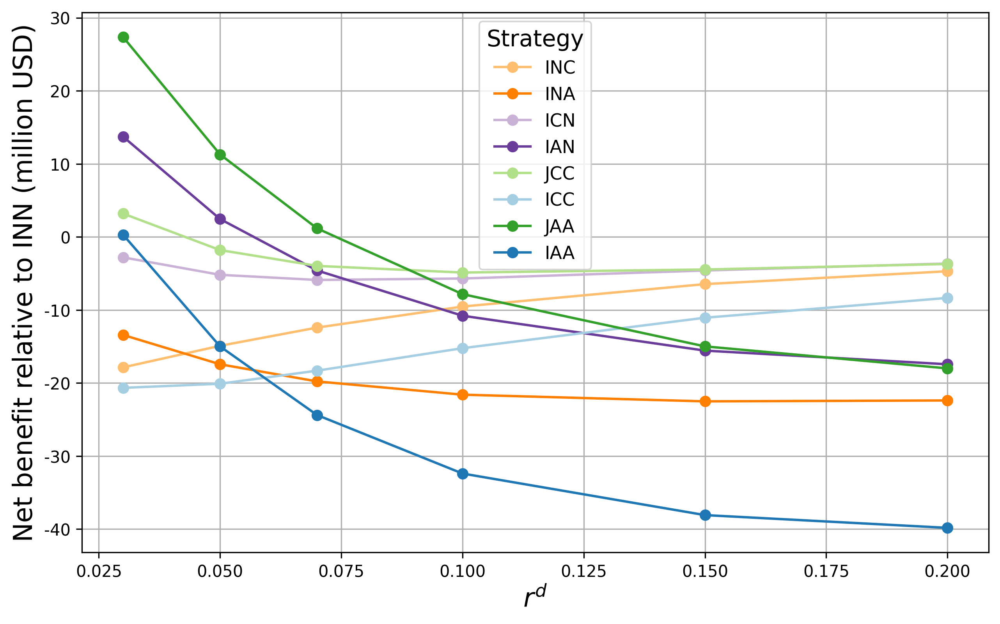

In [87]:
# List of r values
r_values = [0.03,0.05,0.07,0.1,0.15,0.2]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter)   

plt.xlabel(r'$r^d$', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)
plt.legend(title='Strategy', title_fontsize=14, fontsize=11)
plt.grid(True)

plt.show()


## plf

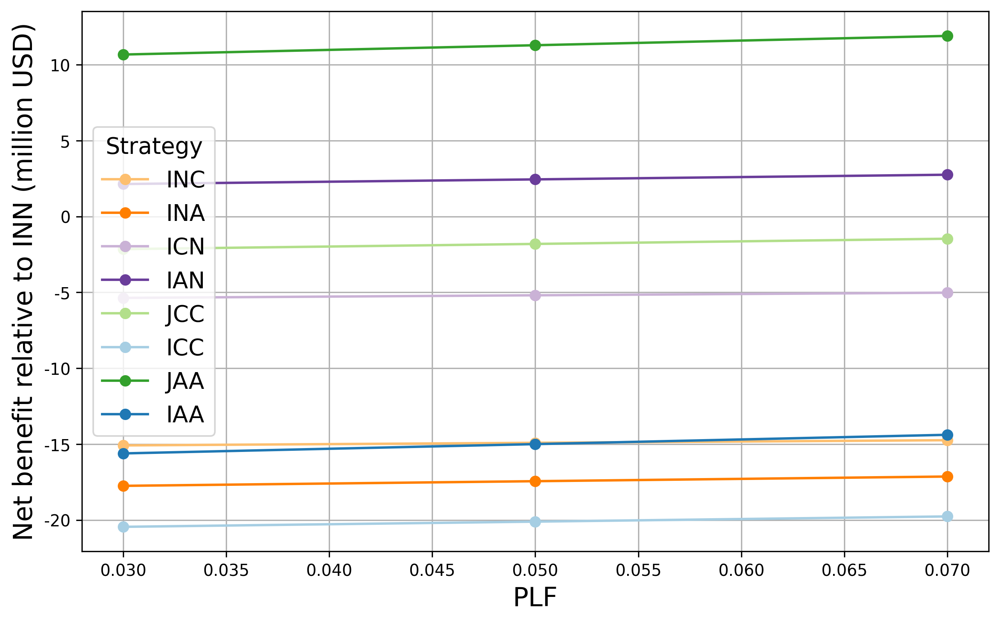

In [33]:
# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# List of r values
plf_values = [0.03,0.05,0.07]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for plf in plf_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_plf={plf}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[plf] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter) 
    
plt.xlabel('PLF', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)
plt.legend(title='Strategy', title_fontsize=14, fontsize=14)
plt.grid(True)

plt.show()


In [34]:
combined_df

,0.03,0.05,0.07
Strategy,,,
INC,-1.508488e+07,-1.491349e+07,-1.474210e+07
INA,-1.774925e+07,-1.744247e+07,-1.713570e+07
ICN,-5.364753e+06,-5.193360e+06,-5.021967e+06
IAN,2.136736e+06,2.443513e+06,2.750290e+06
JCC,-2.152069e+06,-1.809283e+06,-1.466497e+06
ICC,-2.044964e+07,-2.010685e+07,-1.976406e+07
JAA,1.066988e+07,1.128343e+07,1.189698e+07
IAA,-1.561252e+07,-1.499896e+07,-1.438541e+07


## r^{avjt}: Avoided co-deployment conversion cost rate

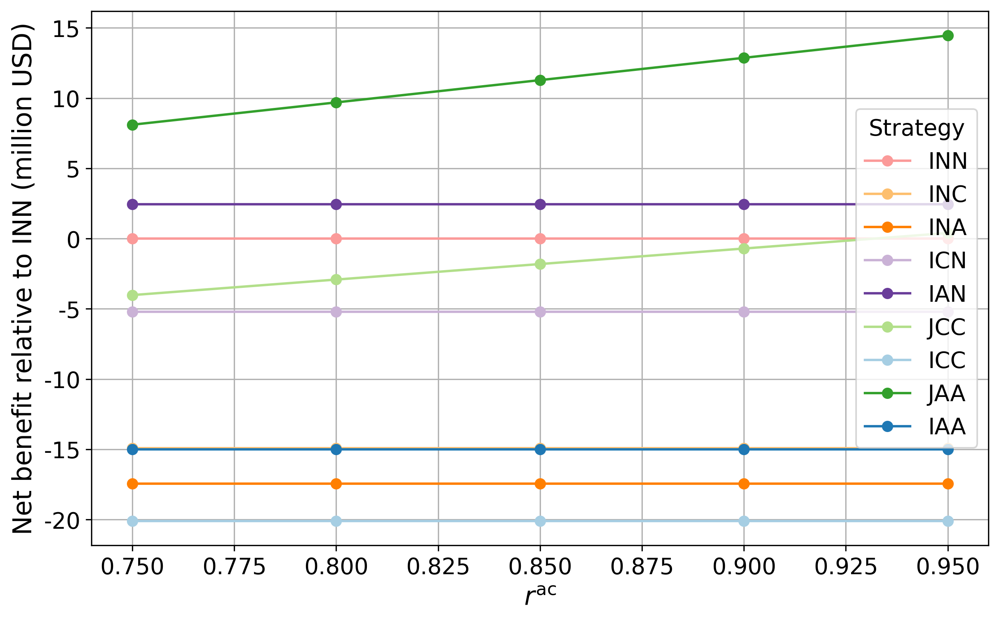

In [60]:
# List of r values
saving_values = [0.05, 0.1, 0.15, 0.2, 0.25]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for saving in saving_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_cost_saving={saving}.csv"
    df = pd.read_csv(file_path)
    #df=df.loc[df['Strategy']!="INN"]
    #df=df.loc[df['Strategy']!="INC"]
    #df=df.loc[df['Strategy']!="INA"]
    #df=df.loc[df['Strategy']!="ICN"]
    #df=df.loc[df['Strategy']!="IAN"]
    #df=df.loc[df['Strategy']!="ICC"]
    #df=df.loc[df['Strategy']!="IAA"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[1-saving] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter) 
    
plt.xlabel(r'$r^{\mathrm{ac}}$', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(title='Strategy', title_fontsize=14, fontsize=14)
plt.grid(True)

plt.show()


## alpha

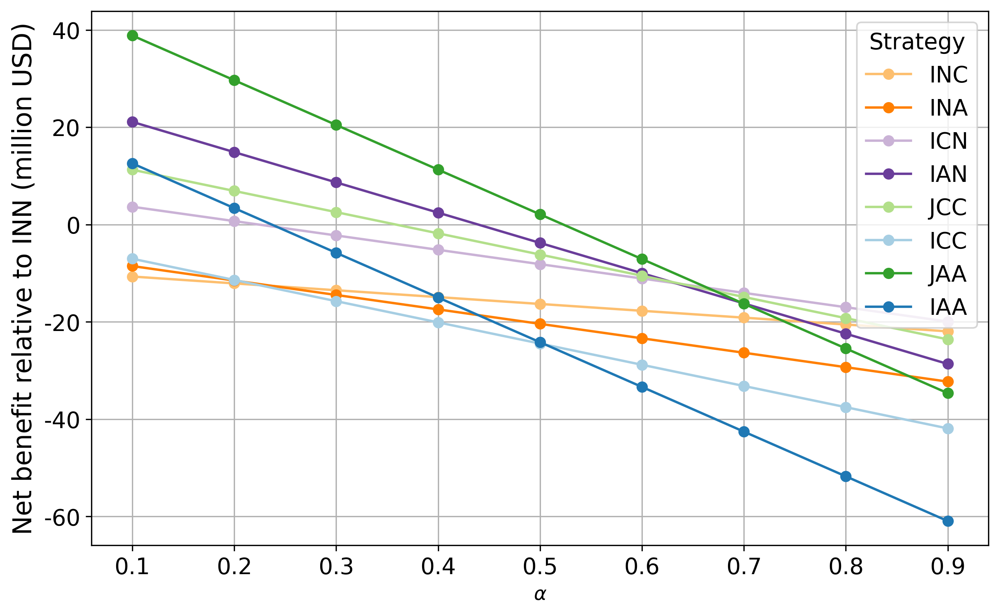

In [36]:
# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'


# List of r values
alpha_values = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for alpha in alpha_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[alpha] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter) 
    
plt.xlabel(r'$\alpha$', fontsize=12)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(title='Strategy', title_fontsize=14, fontsize=14)
plt.grid(True)

plt.show()


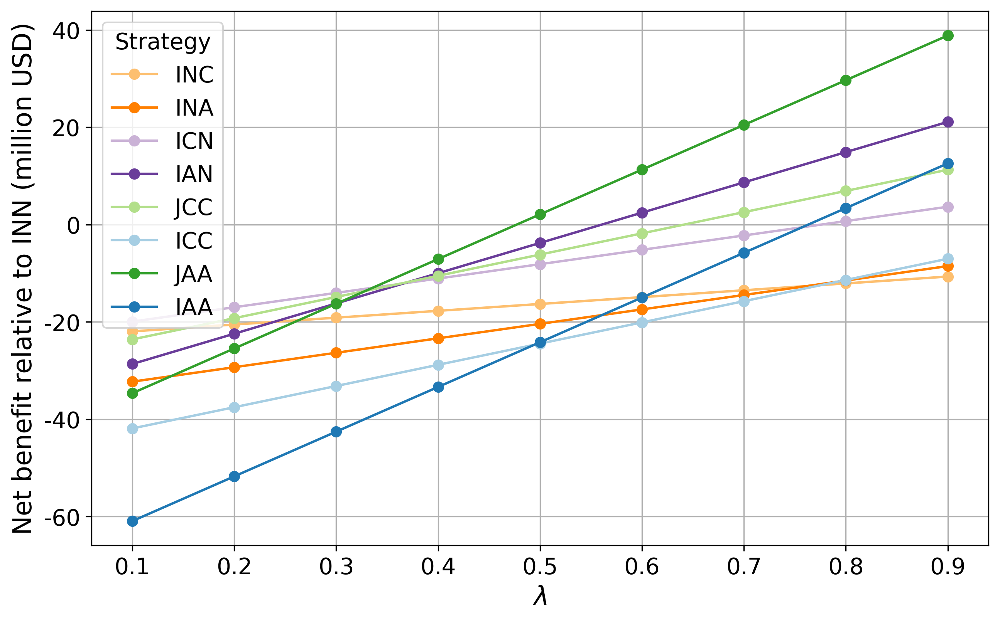

In [27]:
# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'


# List of r values
alpha_values = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for alpha in alpha_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    lamb = 1 - alpha
    data[lamb] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter) 
    
plt.xlabel(r'$\lambda$', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(title='Strategy', title_fontsize=14, fontsize=14)
plt.grid(True)

plt.show()


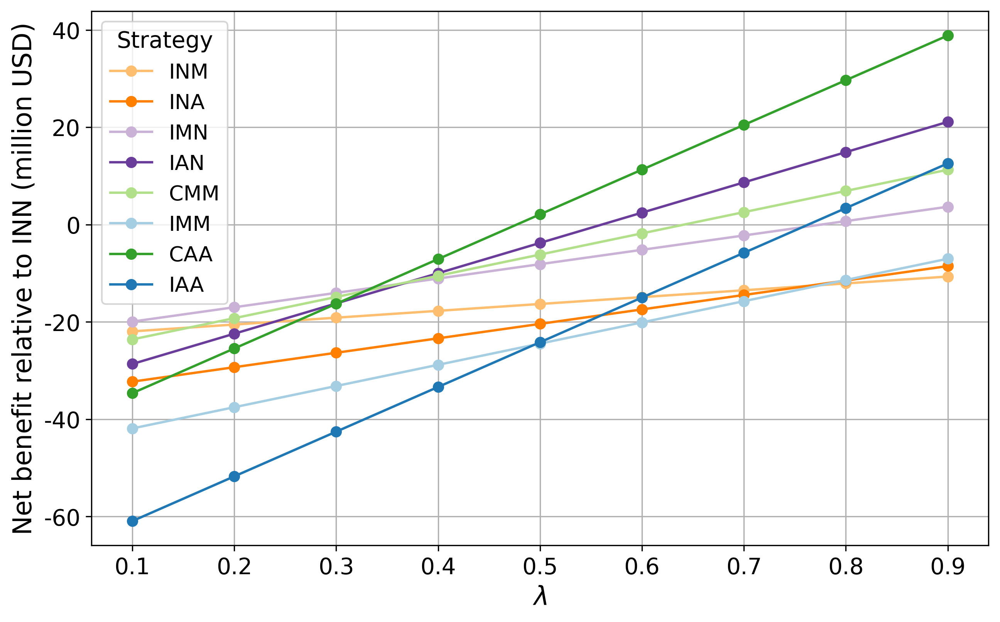

In [30]:
# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'


# List of r values
alpha_values = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for alpha in alpha_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
    df = pd.read_csv(file_path)
    df=df.loc[df['Strategy']!="INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    lamb = 1 - alpha
    data[lamb] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)


# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INM': '#FDBF6F', 'INA': '#FF7F00', 'IMN': '#CAB2D6',
    'IAN': '#6A3D9A', 'CMM': '#B2DF8A', 'IMM': '#A6CEE3', 'CAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter) 
    
plt.xlabel(r'$\lambda$', fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Increase font size for x and y ticks
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

plt.legend(title='Strategy', title_fontsize=14, fontsize=13)
plt.grid(True)

plt.show()


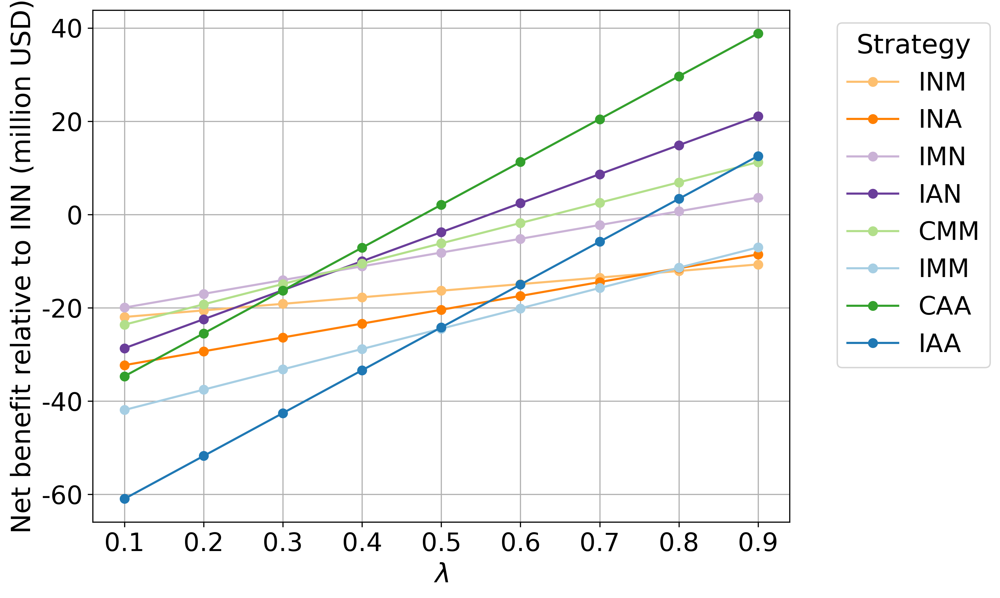

In [34]:
# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# List of alpha values
alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for alpha in alpha_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    lamb = 1 - alpha
    data[lamb] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INM': '#FDBF6F', 'INA': '#FF7F00', 'IMN': '#CAB2D6',
    'IAN': '#6A3D9A', 'CMM': '#B2DF8A', 'IMM': '#A6CEE3', 'CAA': '#33A02C', 'IAA': '#1F78B4'
}

# Plotting
plt.figure(figsize=(10, 6), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter)

plt.xlabel(r'$\lambda$', fontsize=19)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=19)

# Increase font size for x and y ticks
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)

# Adjust legend position
plt.legend(title='Strategy', title_fontsize=19, fontsize=18, bbox_to_anchor=(1.05, 1), loc='upper left')

plt.grid(True)
plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


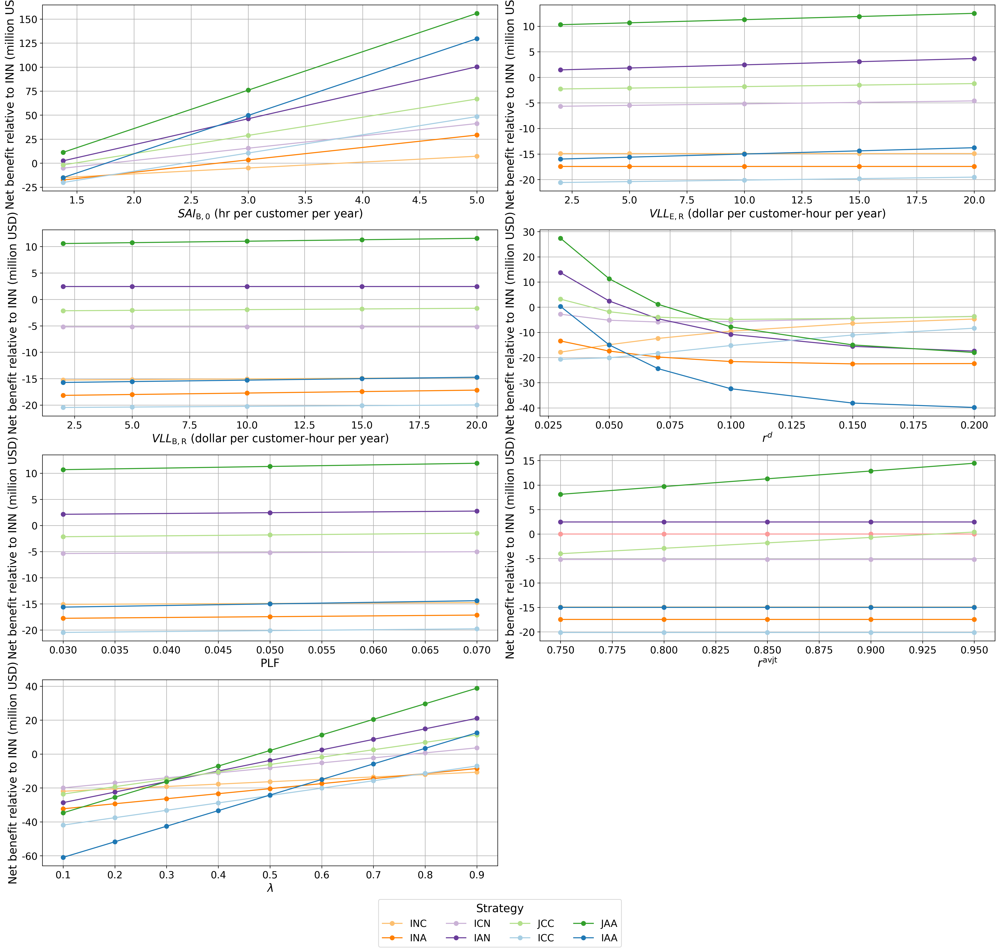

In [43]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 20), dpi=300, sharex=False, sharey=False)
axes = axes.flatten()

# Figure 1
sai_values = [1.38, 3, 5]
data = {}
for sai in sai_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_SAI_{{B,0}}={sai}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[sai] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[0]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$SAI_{\mathrm{B,0}}$ (hr per customer per year)', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Figure 2
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_el_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[1]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{E,R}}$ (dollar per customer-hour per year)', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Figure 3
vll_values = [2, 5, 10, 15, 20]

data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_br_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[2]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{B,R}}$ (dollar per customer-hour per year)', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Figure 4
r_values = [0.03, 0.05, 0.07, 0.1, 0.15, 0.2]
data = {}
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[3]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^d$', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Figure 5
plf_values = [0.03, 0.05, 0.07]
data = {}
for plf in plf_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_plf={plf}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[plf] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[4]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel('PLF', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Figure 6
saving_values = [0.05, 0.1, 0.15, 0.2, 0.25]
data = {}
for saving in saving_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_cost_saving={saving}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    data[1-saving] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[5]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^{\mathrm{avjt}}$', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Figure 7
alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
data = {}
for alpha in alpha_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    lamb = 1 - alpha
    data[lamb] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[6]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$\lambda$', fontsize=16)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=14)

# Hide the last subplot (unused)
axes[-1].axis('off')

# Create a single legend for the entire figure at the bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=4, title='Strategy', title_fontsize=16, fontsize=14)

# Adjust layout to leave space for the legend
plt.tight_layout(rect=[0, 0.05, 1, 0.95])

plt.show()



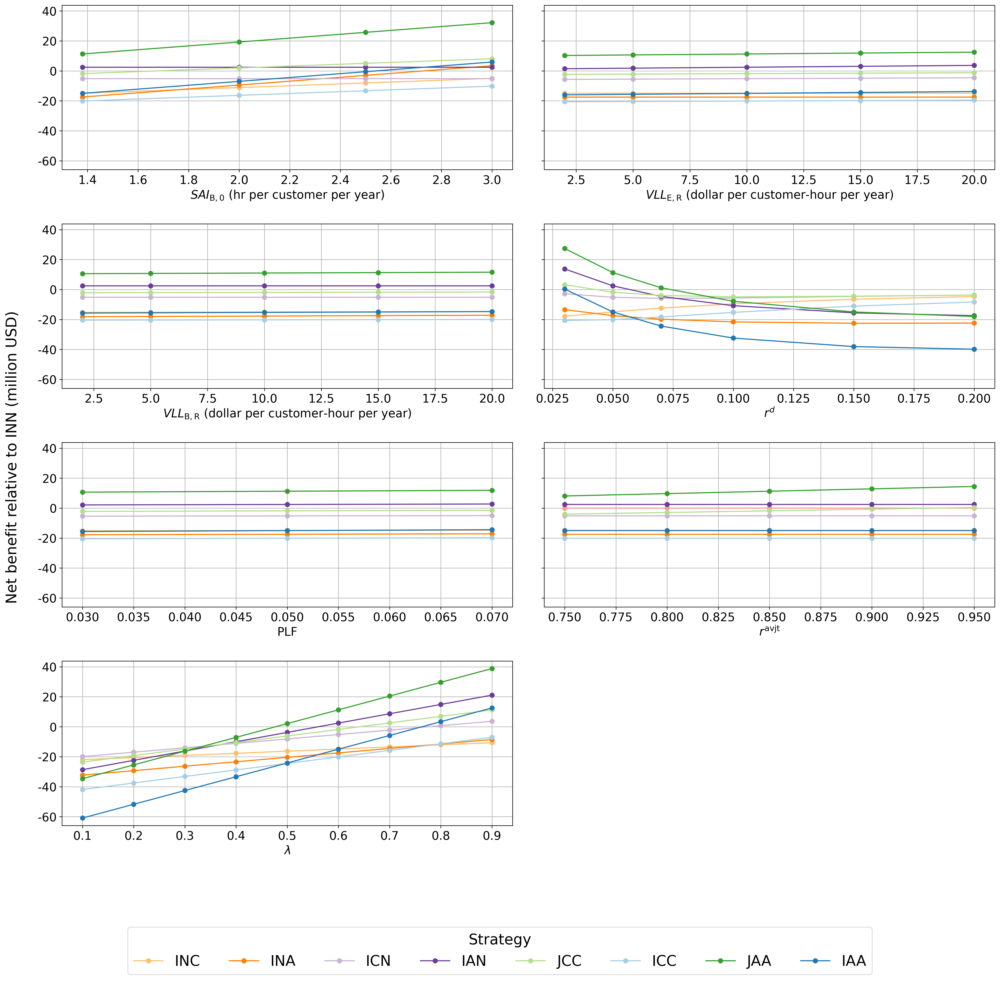

In [56]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(20, 20), dpi=300, sharex=False, sharey=True)
axes = axes.flatten()

# Figure 1
sai_values = [1.38, 2, 2.5, 3]
data = {}
for sai in sai_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_SAI_{{B,0}}={sai}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[sai] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[0]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$SAI_{\mathrm{B,0}}$ (hr per customer per year)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Figure 2
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_el_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[1]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{E,R}}$ (dollar per customer-hour per year)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Figure 3
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_br_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[2]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{B,R}}$ (dollar per customer-hour per year)', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Figure 4
r_values = [0.03, 0.05, 0.07, 0.1, 0.15, 0.2]
data = {}
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[3]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^d$', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Figure 5
plf_values = [0.03, 0.05, 0.07]
data = {}
for plf in plf_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_plf={plf}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[plf] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[4]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel('PLF', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Figure 6
saving_values = [0.05, 0.1, 0.15, 0.2, 0.25]
data = {}
for saving in saving_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_cost_saving={saving}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    data[1-saving] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[5]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^{\mathrm{avjt}}$', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Figure 7
alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
data = {}
for alpha in alpha_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    lamb = 1 - alpha
    data[lamb] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[6]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$\lambda$', fontsize=16)
ax.grid(True)
ax.tick_params(axis='x', labelsize=16)
ax.tick_params(axis='y', labelsize=16)

# Hide the last subplot (unused)
axes[-1].axis('off')

# Set a single y-axis label for the entire figure
fig.text(0.04, 0.5, 'Net benefit relative to INN (million USD)', va='center', rotation='vertical', fontsize=20)

# Create a single legend for the entire figure at the bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=8, title='Strategy', title_fontsize=20, fontsize=20)

# Adjust layout to leave space for the legend
#plt.tight_layout(rect=[0.05, 0.1, 1, 0.95])

# Adjust layout to leave space for the legend and increase spacing between subplots
plt.tight_layout(rect=[0.05, 0.1, 1, 0.95], pad=3.0)

plt.show()


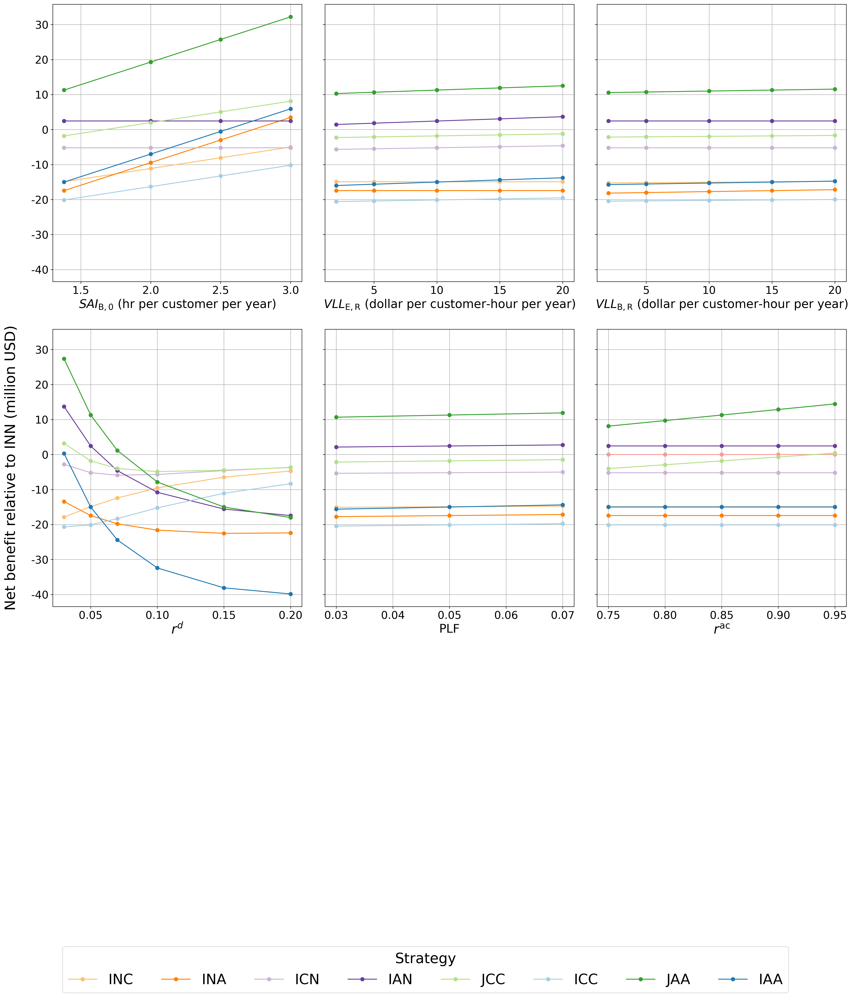

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(21, 25), dpi=300, sharex=False, sharey=True)
axes = axes.flatten()

# Figure 1
sai_values = [1.38, 2, 2.5, 3]
data = {}
for sai in sai_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_SAI_{{B,0}}={sai}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[sai] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[0]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$SAI_{\mathrm{B,0}}$ (hr per customer per year)', fontsize=20)
ax.grid(True)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Figure 2
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_el_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[1]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{E,R}}$ (dollar per customer-hour per year)', fontsize=20)
ax.grid(True)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Figure 3
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_br_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[2]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{B,R}}$ (dollar per customer-hour per year)', fontsize=20)
ax.grid(True)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Figure 4
r_values = [0.03, 0.05, 0.07, 0.1, 0.15, 0.2]
data = {}
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[3]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^d$', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Figure 5
plf_values = [0.03, 0.05, 0.07]
data = {}
for plf in plf_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_plf={plf}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[plf] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[4]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel('PLF', fontsize=20)
ax.grid(True)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Figure 6
saving_values = [0.05, 0.1, 0.15, 0.2, 0.25]
data = {}
for saving in saving_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_cost_saving={saving}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    data[1-saving] = df['net_benefit']
combined_df = pd.DataFrame(data)
ax = axes[5]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^{\mathrm{ac}}$', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)

# Figure 7
#alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
#data = {}
#for alpha in alpha_values:
#    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
#    df = pd.read_csv(file_path)
#    df = df.loc[df['Strategy'] != "INN"]
#    df.set_index('Strategy', inplace=True)
#    lamb = 1 - alpha
#    data[lamb] = df['net_benefit']
#combined_df = pd.DataFrame(data)
#ax = axes[6]
#for strategy in combined_df.index:
#    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
#ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
#ax.set_xlabel(r'$\lambda$', fontsize=22)
#ax.grid(True)
#ax.tick_params(axis='x', labelsize=18)
#ax.tick_params(axis='y', labelsize=18)

# Hide the last subplot (unused)
axes[-3].axis('off')
axes[-2].axis('off')
axes[-1].axis('off')

# Set a single y-axis label for the entire figure
fig.text(0.04, 0.5, 'Net benefit relative to INN (million USD)', va='center', rotation='vertical', fontsize=24)

# Create a single legend for the entire figure at the bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=8, title='Strategy', title_fontsize=24, fontsize=24)

# Adjust layout to leave space for the legend
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95], pad=3.0)

plt.show()


In [18]:
# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

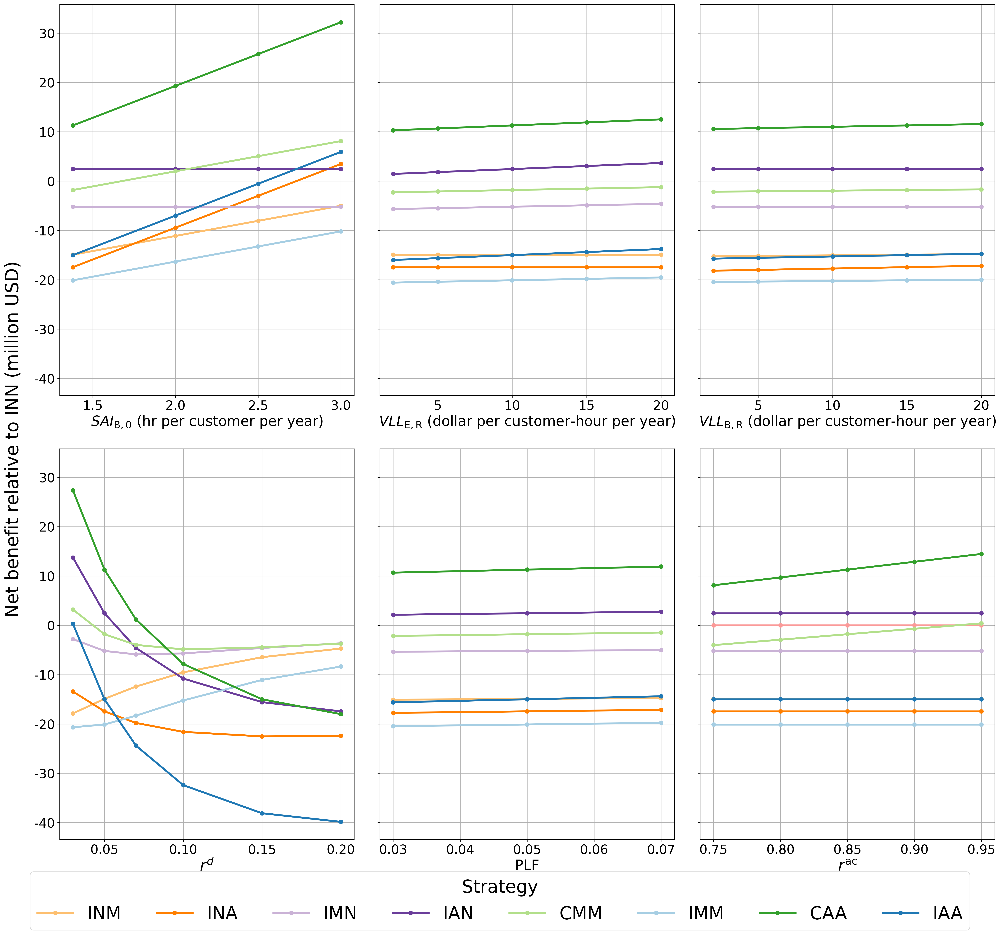

In [40]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INM': '#FDBF6F', 'INA': '#FF7F00', 'IMN': '#CAB2D6',
    'IAN': '#6A3D9A', 'CMM': '#B2DF8A', 'IMM': '#A6CEE3', 'CAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(23, 22), dpi=300, sharex=False, sharey=True)
axes = axes.flatten()

# Figure 1
sai_values = [1.38, 2, 2.5, 3]
data = {}
for sai in sai_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_SAI_{{B,0}}={sai}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[sai] = df['net_benefit']
combined_df = pd.DataFrame(data)


# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[0]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$SAI_{\mathrm{B,0}}$ (hr per customer per year)', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 2
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_el_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[1]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{E,R}}$ (dollar per customer-hour per year)', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 3
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_br_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[2]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{B,R}}$ (dollar per customer-hour per year)', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 4
r_values = [0.03, 0.05, 0.07, 0.1, 0.15, 0.2]
data = {}
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[3]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^d$', fontsize=24)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 5
plf_values = [0.03, 0.05, 0.07]
data = {}
for plf in plf_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_plf={plf}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[plf] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[4]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel('PLF', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 6
saving_values = [0.05, 0.1, 0.15, 0.2, 0.25]
data = {}
for saving in saving_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_cost_saving={saving}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    data[1-saving] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[5]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^{\mathrm{ac}}$', fontsize=24)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 7
#alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
#data = {}
#for alpha in alpha_values:
#    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
#    df = pd.read_csv(file_path)
#    df = df.loc[df['Strategy'] != "INN"]
#    df.set_index('Strategy', inplace=True)
#    lamb = 1 - alpha
#    data[lamb] = df['net_benefit']
#combined_df = pd.DataFrame(data)
#ax = axes[6]
#for strategy in combined_df.index:
#    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
#ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
#ax.set_xlabel(r'$\lambda$', fontsize=22)
#ax.grid(True)
#ax.tick_params(axis='x', labelsize=18)
#ax.tick_params(axis='y', labelsize=18)

# Hide the last subplot (unused)
#axes[-3].axis('off')
#axes[-2].axis('off')
#axes[-1].axis('off')

# Set a single y-axis label for the entire figure
fig.text(0.04, 0.5, 'Net benefit relative to INN (million USD)', va='center', rotation='vertical', fontsize=28)

# Create a single legend for the entire figure at the bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=8, title='Strategy', title_fontsize=28, fontsize=28)

# Adjust layout to leave space for the legend
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95], pad=3.0)

plt.show()


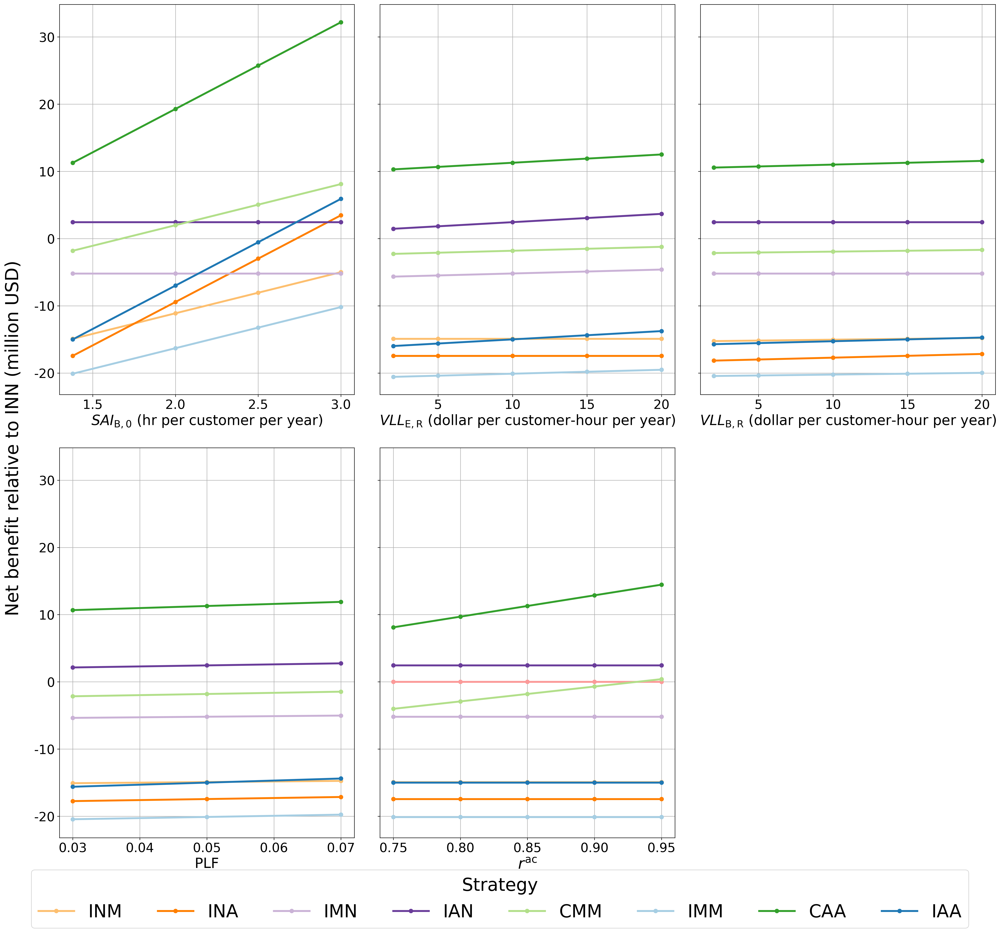

In [58]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Base path to the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INM': '#FDBF6F', 'INA': '#FF7F00', 'IMN': '#CAB2D6',
    'IAN': '#6A3D9A', 'CMM': '#B2DF8A', 'IMM': '#A6CEE3', 'CAA': '#33A02C', 'IAA': '#1F78B4'
}

# Function to format the y-axis tick labels as millions
def millions_formatter(x, pos):
    return f'{x * 1e-6:.0f}'

# Create a figure and a grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(23, 22), dpi=300, sharex=False, sharey=True)
axes = axes.flatten()

# Figure 1
sai_values = [1.38, 2, 2.5, 3]
data = {}
for sai in sai_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_SAI_{{B,0}}={sai}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[sai] = df['net_benefit']
combined_df = pd.DataFrame(data)


# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[0]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$SAI_{\mathrm{B,0}}$ (hr per customer per year)', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 2
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_el_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[1]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{E,R}}$ (dollar per customer-hour per year)', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 3
vll_values = [2, 5, 10, 15, 20]
data = {}
for vll in vll_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_vll_br_R_{vll}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[vll] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[2]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$VLL_{\mathrm{B,R}}$ (dollar per customer-hour per year)', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 4
plf_values = [0.03, 0.05, 0.07]
data = {}
for plf in plf_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_plf={plf}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    df.set_index('Strategy', inplace=True)
    data[plf] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[3]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel('PLF', fontsize=22)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Figure 5
saving_values = [0.05, 0.1, 0.15, 0.2, 0.25]
data = {}
for saving in saving_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_cost_saving={saving}.csv"
    df = pd.read_csv(file_path)
    df.set_index('Strategy', inplace=True)
    data[1-saving] = df['net_benefit']
combined_df = pd.DataFrame(data)

# Renaming map
rename_map = {
    'INN': 'INN',
    'INC': 'INM',
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN',
    'JCC': 'CMM',
    'ICC': 'IMM',
    'JAA': 'CAA',
    'IAA': 'IAA'
}

combined_df.index = combined_df.index.to_series().replace(rename_map)

ax = axes[4]
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy], linewidth=3, alpha=1)
ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
ax.set_xlabel(r'$r^{\mathrm{ac}}$', fontsize=24)
ax.grid(True)
ax.tick_params(axis='x', labelsize=20)
ax.tick_params(axis='y', labelsize=20)

# Hide the last subplot (unused)
axes[-1].axis('off')

# Figure 7
#alpha_values = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
#data = {}
#for alpha in alpha_values:
#    file_path = f"{base_path}npv_cost_loss_benefit_relative_alpha={alpha}.csv"
#    df = pd.read_csv(file_path)
#    df = df.loc[df['Strategy'] != "INN"]
#    df.set_index('Strategy', inplace=True)
#    lamb = 1 - alpha
#    data[lamb] = df['net_benefit']
#combined_df = pd.DataFrame(data)
#ax = axes[6]
#for strategy in combined_df.index:
#    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy, marker='o', color=strategy_colors[strategy])
#ax.yaxis.set_major_formatter(FuncFormatter(millions_formatter))
#ax.set_xlabel(r'$\lambda$', fontsize=22)
#ax.grid(True)
#ax.tick_params(axis='x', labelsize=18)
#ax.tick_params(axis='y', labelsize=18)

# Hide the last subplot (unused)
#axes[-3].axis('off')
#axes[-2].axis('off')
#axes[-1].axis('off')

# Set a single y-axis label for the entire figure
fig.text(0.04, 0.5, 'Net benefit relative to INN (million USD)', va='center', rotation='vertical', fontsize=28)

# Create a single legend for the entire figure at the bottom
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=8, title='Strategy', title_fontsize=28, fontsize=28)

# Adjust layout to leave space for the legend
plt.tight_layout(rect=[0.05, 0.05, 1, 0.95], pad=3.0)

plt.show()


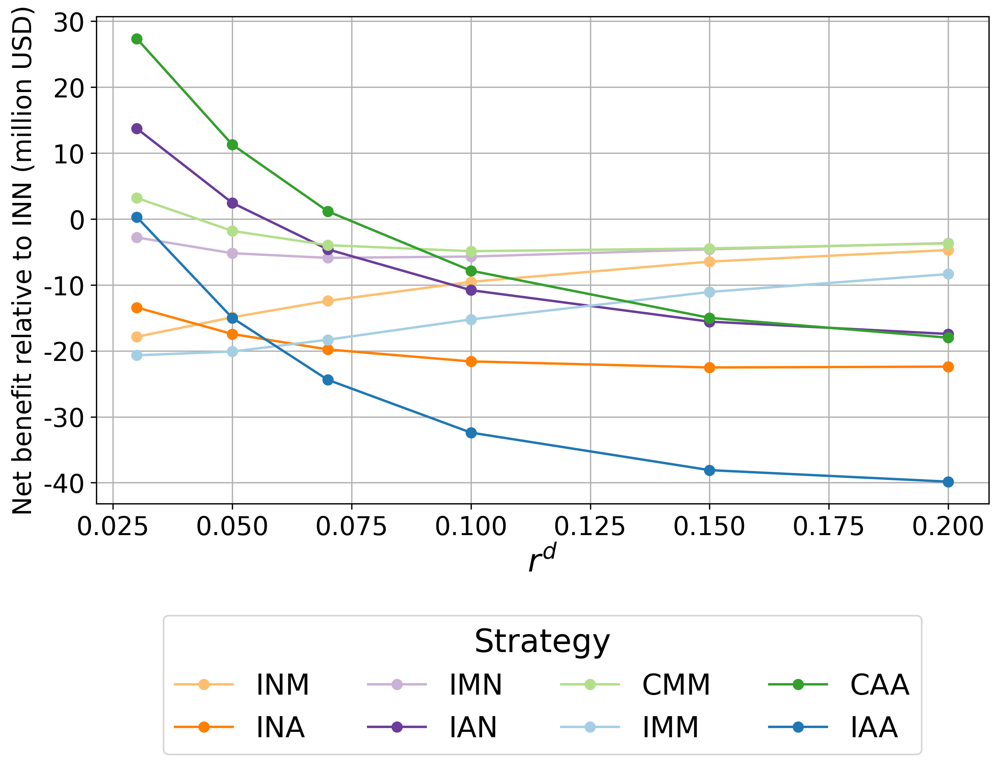

In [25]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Function to format the y-axis labels
def millions_formatter(x, pos):
    return '%1.0f' % (x * 1e-6)

# List of r values
r_values = [0.03, 0.05, 0.07, 0.1, 0.15, 0.2]

# Base path for the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Mapping of old strategy names to new ones
strategy_renaming = {
    'INN': 'INN', 
    'INC': 'INM', 
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN', 
    'JCC': 'CMM', 
    'ICC': 'IMM',
    'JAA': 'CAA', 
    'IAA': 'IAA'
}

# Plotting
plt.figure(figsize=(10, 5.5), dpi=300)
for strategy in combined_df.index:
    plt.plot(combined_df.columns, combined_df.loc[strategy], label=strategy_renaming[strategy], marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
plt.gca().yaxis.set_major_formatter(formatter)   

plt.xlabel(r'$r^d$', fontsize=20)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Set legend below the plot in two rows
plt.legend(title='Strategy', title_fontsize=20, fontsize=18, loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=4)

plt.grid(True)

plt.show()


In [176]:
combined_df

,0.03,0.05,0.07,0.10,0.15,0.20
Strategy,,,,,,
INC,-1.786500e+07,-1.491349e+07,-1.241947e+07,-9.537808e+06,-6.465832e+06,-4.709405e+06
INA,-1.342702e+07,-1.744247e+07,-1.978942e+07,-2.160435e+07,-2.252051e+07,-2.239649e+07
ICN,-2.804183e+06,-5.193360e+06,-5.898034e+06,-5.700007e+06,-4.602955e+06,-3.646019e+06
IAN,1.371929e+07,2.443513e+06,-4.602575e+06,-1.079690e+07,-1.557096e+07,-1.744169e+07
JCC,3.189451e+06,-1.809283e+06,-3.971971e+06,-4.883478e+06,-4.466478e+06,-3.711749e+06
ICC,-2.066918e+07,-2.010685e+07,-1.831750e+07,-1.523782e+07,-1.106879e+07,-8.355424e+06
JAA,2.735630e+07,1.128343e+07,1.164967e+06,-7.841441e+06,-1.499363e+07,-1.800419e+07
IAA,2.922680e+05,-1.499896e+07,-2.439200e+07,-3.240125e+07,-3.809147e+07,-3.983818e+07


### Fix the issue with the sizing of two plots for the paper

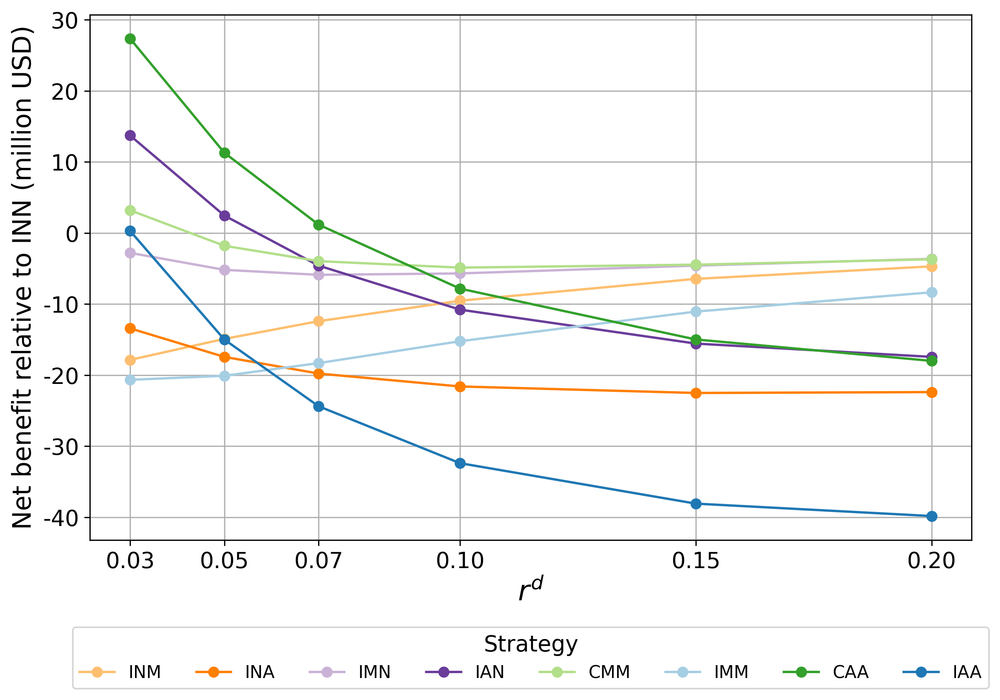

In [276]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Function to format the y-axis labels
def millions_formatter(x, pos):
    return '%1.0f' % (x * 1e-6)

# List of r values
r_values = [0.03, 0.05, 0.07, 0.1, 0.15, 0.2]

# Base path for the CSV files
base_path = '../../results/outcomes/Sensitivity2/'

# Dictionary to hold data
data = {}

# Read each CSV and extract the 'net_benefit' column
for r in r_values:
    file_path = f"{base_path}npv_cost_loss_benefit_relative_r={r}.csv"
    df = pd.read_csv(file_path)
    df = df.loc[df['Strategy'] != "INN"]
    # Make sure the strategy names are set as the index
    df.set_index('Strategy', inplace=True)
    data[r] = df['net_benefit']

# Create a DataFrame from the dictionary
combined_df = pd.DataFrame(data)

# Define colors for each strategy
strategy_colors = {
    'INN': '#FB9A99', 'INC': '#FDBF6F', 'INA': '#FF7F00', 'ICN': '#CAB2D6',
    'IAN': '#6A3D9A', 'JCC': '#B2DF8A', 'ICC': '#A6CEE3', 'JAA': '#33A02C', 'IAA': '#1F78B4'
}

# Mapping of old strategy names to new ones
strategy_renaming = {
    'INN': 'INN', 
    'INC': 'INM', 
    'INA': 'INA',
    'ICN': 'IMN',
    'IAN': 'IAN', 
    'JCC': 'CMM', 
    'ICC': 'IMM',
    'JAA': 'CAA', 
    'IAA': 'IAA'
}

# Plotting
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)  # Adjusted figsize to match second plot
for strategy in combined_df.index:
    ax.plot(combined_df.columns, combined_df.loc[strategy], label=strategy_renaming[strategy], marker='o', color=strategy_colors[strategy])

# Set y-axis formatter
formatter = FuncFormatter(millions_formatter)
ax.yaxis.set_major_formatter(formatter)   

ax.set_xlabel(r'$r^d$', fontsize=18)
ax.set_xticks(combined_df.columns)
ax.tick_params(axis='both', labelsize=14)
ax.set_ylabel('Net benefit relative to INN (million USD)', fontsize=16)

# Set legend below the plot in one line
ax.legend(title='Strategy', title_fontsize=14, fontsize=11, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=len(strategy_renaming))

ax.grid(True)

# Save the figure
plt.savefig('first_plot.png', bbox_inches='tight')

plt.show()


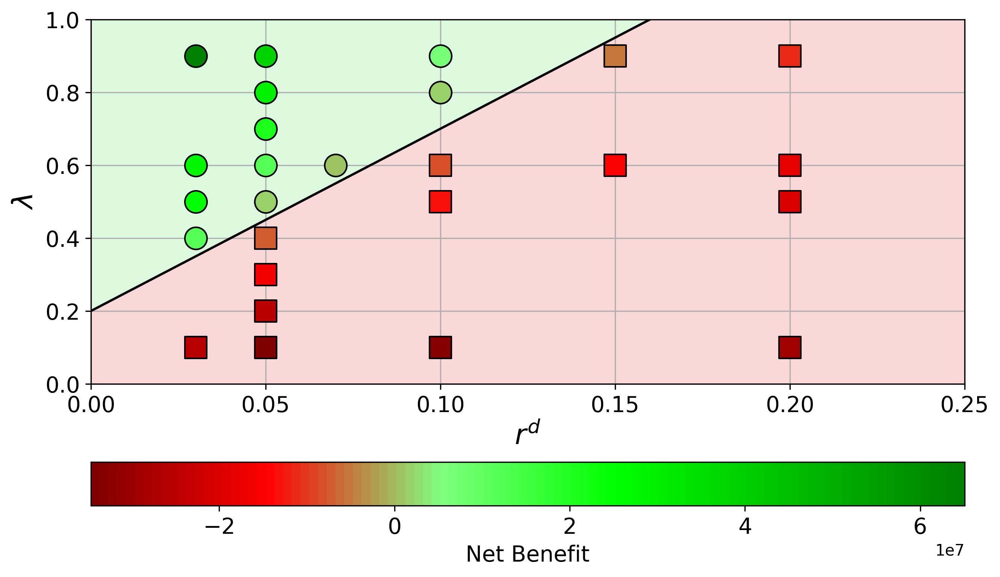

In [278]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from matplotlib.colors import Normalize, LinearSegmentedColormap

# Provided data
data = {
    'net_benefit': [-2.563653e+07, -3.275143e+07, -2.941783e+07, 6.505669e+07, 7.104551e+06,
                    -1.115601e+07, 2.463066e+07, -1.282344e+07, -2.028692e+07, 2.735630e+07,
                    1.128343e+07, 1.164967e+06, -1.499363e+07, -1.800419e+07, 3.884898e+07,
                    2.966047e+07, 2.047195e+07, 2.094913e+06, -7.093605e+06, -1.628212e+07,
                    -2.547064e+07, -3.465916e+07, -5.387631e+06, -7.841441e+06, 1.206386e+07,
                    2.122554e+06],
    'lambda': [0.1, 0.1, 0.1, 0.9, 0.9, 0.9, 0.5, 0.5, 0.5, 0.6, 0.6, 0.6, 0.6, 0.6, 0.9, 0.8, 0.7, 0.5, 0.4, 0.3, 0.2, 0.1, 0.9, 0.6, 0.4, 0.8],
    'r': [0.03, 0.10, 0.20, 0.03, 0.10, 0.20, 0.03, 0.10, 0.20, 0.03, 0.05, 0.07, 0.15, 0.20, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.15, 0.10, 0.03, 0.10],
    'label': [False, False, False, True, True, False, True, False, False, True, True, True, False, False, True, True, True, True, False, False, False, False, False, False, True, True]
}
combined_df = pd.DataFrame(data)

# Train SVM with linear kernel and scale the features
X = combined_df[['r', 'lambda']].values
y = combined_df['label'].astype(int).values

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Increase C to enforce hard margin
svm = SVC(kernel='linear', C=1e6)
svm.fit(X_scaled, y)

# Get the separating hyperplane
w = svm.coef_[0]
a = -w[0] / w[1]

# Define xx to cover the full x-axis range
xx = np.linspace(0, 0.25, 100)  # Adjust this range as needed

# Scale xx using the same scaler
xx_scaled = scaler.transform(np.c_[xx, np.zeros_like(xx)])[:, 0]

# Calculate the corresponding yy values
yy_scaled = a * xx_scaled - (svm.intercept_[0] / w[1])

# Transform the coordinates back to original scale
_, yy_orig = scaler.inverse_transform(np.c_[xx_scaled, yy_scaled]).T

# Create a colormap from dark red to dark green
colors = [
    (0.5, 0, 0),  # Dark red
#    (0.75, 0, 0),  # Medium red
    (1, 0, 0),  # Light red
    (0.5, 1, 0.5),  # Light green transition
    (0, 1, 0),  # Light green
    (0, 0.75, 0),  # Medium green
    (0, 0.5, 0)  # Dark green
]
n_bins = 100  # Discretize the interpolation into bins
cmap_name = 'red_green'
cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plotting
fig, ax = plt.subplots(figsize=(10, 6), dpi=300)  # Adjusted figsize to match first plot

# Plot the decision boundary
ax.plot(xx, yy_orig, 'k-')

# Shade the areas with light colors
ax.fill_between(xx, yy_orig, 1, color='lightgreen', alpha=0.3)
ax.fill_between(xx, yy_orig, 0, color='lightcoral', alpha=0.3)

# Draw scatter points with gradient colors and outline
norm = Normalize(vmin=combined_df['net_benefit'].min(), vmax=combined_df['net_benefit'].max())
for index, row in combined_df.iterrows():
    color = cmap(norm(row['net_benefit']))
    marker_style = 'o' if row['net_benefit'] >= 0 else 's'  # Use square markers for negative
    edge_color = 'black'
    ax.scatter(row['r'], row['lambda'], facecolor=color, edgecolor=edge_color, s=200, zorder=3, marker=marker_style, linewidth=1)

ax.set_xlabel(r'$r^d$', fontsize=18)
ax.set_ylabel(r'$\lambda$', fontsize=18)

# Increase font size for x and y ticks
ax.tick_params(axis='both', labelsize=14)

ax.set_xlim(0, 0.25)
ax.set_ylim(0, 1)

ax.grid(True)

# Add color bar at the bottom
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])

cbar = plt.colorbar(sm, orientation='horizontal', pad=0.15, ax=ax)
cbar.set_label('Net Benefit', fontsize=14)
cbar.ax.tick_params(labelsize=14)

# Save the figure
plt.savefig('second_plot.png', bbox_inches='tight')

plt.show()
